In [28]:
%matplotlib inline

# Supressing the warning messages
import warnings
warnings.filterwarnings('ignore')

import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import glob
import seaborn as sns
import datetime
from datetime import datetime, timedelta
import geopandas as gpd
from shapely.geometry import Point, Polygon
import contextily as ctx
import math
import matplotlib as mpl

from sklearn.linear_model import LinearRegression
from sklearn import neighbors
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm

In [29]:
chicago_2015 = pd.read_csv('/Users/Lukas/Downloads/Chicago/chicago_2015.csv')
chicago_2016 = pd.read_csv('/Users/Lukas/Downloads/Chicago/chicago_2016.csv')
chicago_2017 = pd.read_csv('/Users/Lukas/Downloads/Chicago/chicago_2017.csv')
chicago_2018 = pd.read_csv('/Users/Lukas/Downloads/Chicago/chicago_2018.csv')
chicago_2019 = pd.read_csv('/Users/Lukas/Downloads/Chicago/chicago_2019.csv')

In [100]:
chicago_2015.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type
0,3/31/2015 23:58,4/1/2015 0:03,117,300,Wilton Ave & Belmont Ave,Broadway & Barry Ave,1095,Subscriber
1,3/31/2015 23:59,4/1/2015 0:15,43,85,Michigan Ave & Washington St,Michigan Ave & Oak St,537,Customer
2,3/31/2015 23:59,4/1/2015 0:11,162,67,Damen Ave & Wellington Ave,Sheffield Ave & Fullerton Ave,2350,Subscriber
3,3/31/2015 23:59,4/1/2015 0:19,51,59,Clark St & Randolph St,Wabash Ave & Roosevelt Rd,938,Customer
4,3/31/2015 23:54,4/1/2015 0:15,134,216,Peoria St & Jackson Blvd,California Ave & Division St,379,Subscriber


In [101]:
chicago_2016.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type
0,3/31/2016 23:53,4/1/2016 0:07,344,458,Ravenswood Ave & Lawrence Ave,Broadway & Thorndale Ave,155,Subscriber
1,3/31/2016 23:46,3/31/2016 23:57,128,213,Damen Ave & Chicago Ave,Leavitt St & North Ave,4831,Subscriber
2,3/31/2016 23:42,3/31/2016 23:46,350,210,Ashland Ave & Chicago Ave,Ashland Ave & Division St,4232,Subscriber
3,3/31/2016 23:37,3/31/2016 23:55,303,458,Broadway & Cornelia Ave,Broadway & Thorndale Ave,3464,Subscriber
4,3/31/2016 23:33,3/31/2016 23:37,334,329,Lake Shore Dr & Belmont Ave,Lake Shore Dr & Diversey Pkwy,1750,Subscriber


In [102]:
chicago_2017.head()


,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type
0,3/31/2017 23:59:07,4/1/2017 00:13:24,66,171,Clinton St & Lake St,May St & Cullerton St,5292,Subscriber
1,3/31/2017 23:56:25,4/1/2017 00:00:21,199,26,Wabash Ave & Grand Ave,McClurg Ct & Illinois St,4408,Subscriber
2,3/31/2017 23:55:33,4/1/2017 00:01:21,520,432,Greenview Ave & Jarvis Ave,Clark St & Lunt Ave,696,Subscriber
3,3/31/2017 23:54:46,3/31/2017 23:59:34,110,142,Dearborn St & Erie St,McClurg Ct & Erie St,4915,Subscriber
4,3/31/2017 23:53:33,4/1/2017 00:00:28,327,331,Sheffield Ave & Webster Ave,Halsted St & Blackhawk St (*),4247,Subscriber


In [103]:
chicago_2018.tail()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type
3603077,2018-03-31 23:46:34,2018-04-01 00:05:24,158,260,Milwaukee Ave & Wabansia Ave,Kedzie Ave & Milwaukee Ave,1935,Subscriber
3603078,2018-03-31 23:47:43,2018-03-31 23:52:05,299,229,Halsted St & Roscoe St,Southport Ave & Roscoe St,5852,Subscriber
3603079,2018-03-31 23:50:18,2018-03-31 23:57:38,327,226,Sheffield Ave & Webster Ave,Racine Ave & Belmont Ave,4414,Subscriber
3603080,2018-03-31 23:52:26,2018-04-01 00:07:13,265,426,Cottage Grove Ave & Oakwood Blvd,Ellis Ave & 60th St,6448,Subscriber
3603081,2018-03-31 23:53:38,2018-04-01 00:03:08,485,475,Sawyer Ave & Irving Park Rd,Washtenaw Ave & Lawrence Ave,2769,Subscriber


In [104]:
chicago_2019.tail()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type
3817999,2019-12-31 23:56:13,2020-01-01 00:15:45,112,225,Green St & Randolph St,Halsted St & Dickens Ave,2196,Subscriber
3818000,2019-12-31 23:56:34,2020-01-01 00:22:08,90,90,Millennium Park,Millennium Park,4877,Subscriber
3818001,2019-12-31 23:57:05,2020-01-01 00:05:46,623,52,Michigan Ave & 8th St,Michigan Ave & Lake St,863,Subscriber
3818002,2019-12-31 23:57:11,2020-01-01 00:05:45,623,52,Michigan Ave & 8th St,Michigan Ave & Lake St,2637,Subscriber
3818003,2019-12-31 23:57:17,2019-12-31 23:59:18,256,240,Broadway & Sheridan Rd,Sheridan Rd & Irving Park Rd,5930,Subscriber


In [30]:
chicago_data = pd.concat([chicago_2015, chicago_2016, chicago_2017, chicago_2018, chicago_2019], axis=0)

In [31]:
def correct_data_types(chicagobikes):
  
    #Converting start-time to datetime
    chicagobikes['start'] = pd.to_datetime(chicagobikes['start_time']).dt.floor('min')
    #Converting end-time to datetime
    chicagobikes['end'] = pd.to_datetime(chicagobikes['end_time']).dt.floor('min')
    
   
    # rounding start time
    chicagobikes['time_rounded'] = chicagobikes['start'].dt.floor('H')
    
    # The day of the week with Monday=0, Sunday=6, week of year,month, day of month, hour of day
    chicagobikes['weekday'] = chicagobikes['time_rounded'].dt.weekday
    chicagobikes['week'] = chicagobikes['time_rounded'].dt.isocalendar().week
    chicagobikes['month'] = chicagobikes['time_rounded'].dt.month
    chicagobikes['day_of_month'] = chicagobikes['time_rounded'].dt.day
    chicagobikes['hour_of_day'] = chicagobikes['time_rounded'].dt.hour
  
    #trip duration
    chicagobikes['trip_duration'] = chicagobikes['end'] - chicagobikes['start']
    # date
    chicagobikes['date'] = chicagobikes['time_rounded'].dt.date
    
    return chicagobikes

In [32]:
#apply function
chicago_data = correct_data_types(chicago_data)

In [56]:
chicago_data.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,end,time_rounded,weekday,week,month,day_of_month,hour_of_day,trip_duration,date
0,3/31/2015 23:58,4/1/2015 0:03,117,300,Wilton Ave & Belmont Ave,Broadway & Barry Ave,1095,Subscriber,2015-03-31 23:58:00,2015-04-01 00:03:00,2015-03-31 23:00:00,1,14,3,31,23,0 days 00:05:00,2015-03-31
1,3/31/2015 23:59,4/1/2015 0:15,43,85,Michigan Ave & Washington St,Michigan Ave & Oak St,537,Customer,2015-03-31 23:59:00,2015-04-01 00:15:00,2015-03-31 23:00:00,1,14,3,31,23,0 days 00:16:00,2015-03-31
2,3/31/2015 23:59,4/1/2015 0:11,162,67,Damen Ave & Wellington Ave,Sheffield Ave & Fullerton Ave,2350,Subscriber,2015-03-31 23:59:00,2015-04-01 00:11:00,2015-03-31 23:00:00,1,14,3,31,23,0 days 00:12:00,2015-03-31
3,3/31/2015 23:59,4/1/2015 0:19,51,59,Clark St & Randolph St,Wabash Ave & Roosevelt Rd,938,Customer,2015-03-31 23:59:00,2015-04-01 00:19:00,2015-03-31 23:00:00,1,14,3,31,23,0 days 00:20:00,2015-03-31
4,3/31/2015 23:54,4/1/2015 0:15,134,216,Peoria St & Jackson Blvd,California Ave & Division St,379,Subscriber,2015-03-31 23:54:00,2015-04-01 00:15:00,2015-03-31 23:00:00,1,14,3,31,23,0 days 00:21:00,2015-03-31


In [10]:
chicago_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18028922 entries, 0 to 3818003
Data columns (total 18 columns):
 #   Column              Dtype          
---  ------              -----          
 0   start_time          object         
 1   end_time            object         
 2   start_station_id    int64          
 3   end_station_id      int64          
 4   start_station_name  object         
 5   end_station_name    object         
 6   bike_id             int64          
 7   user_type           object         
 8   start               datetime64[ns] 
 9   end                 datetime64[ns] 
 10  time_rounded        datetime64[ns] 
 11  weekday             int64          
 12  week                UInt32         
 13  month               int64          
 14  day_of_month        int64          
 15  hour_of_day         int64          
 16  trip_duration       timedelta64[ns]
 17  date                object         
dtypes: UInt32(1), datetime64[ns](3), int64(7), object(6), timedel

In [338]:
chicago_data.isna().sum()

start_time            0
end_time              0
start_station_id      0
end_station_id        0
start_station_name    0
end_station_name      0
bike_id               0
user_type             0
start                 0
end                   0
time_rounded          0
weekday               0
week                  0
month                 0
day_of_month          0
hour_of_day           0
trip_duration         0
date                  0
trips_per_hour        0
dtype: int64

In [339]:
chicago_data.nunique()

start_time            8974502
end_time              8735325
start_station_id          629
end_station_id            630
start_station_name        684
end_station_name          684
bike_id                  6405
user_type                   2
start                 1211513
end                   1212267
time_rounded            26221
weekday                     7
week                       52
month                      12
day_of_month               31
hour_of_day                24
trip_duration            3776
date                     1095
trips_per_hour           2115
dtype: int64

In [340]:
chicago_data['start_station_name'].value_counts()

Streeter Dr & Grand Ave           204324
Canal St & Adams St               167022
Clinton St & Washington Blvd      146091
Clinton St & Madison St           145085
Lake Shore Dr & Monroe St         119524
                                   ...  
Michigan Ave & 71st St                10
South Chicago Ave & Elliot Ave         9
Elizabeth St & 59th St                 6
Phillips Ave & 82nd St                 1
TS ~ DIVVY PARTS TESTING               1
Name: start_station_name, Length: 684, dtype: int64

In [341]:
chicago_data['end_station_name'].value_counts()

Streeter Dr & Grand Ave           237793
Canal St & Adams St               160982
Clinton St & Madison St           146654
Clinton St & Washington Blvd      144565
Lake Shore Dr & North Blvd        124989
                                   ...  
Michigan Ave & 71st St                14
Elizabeth St & 59th St                11
South Chicago Ave & Elliot Ave         6
TS ~ DIVVY PARTS TESTING               2
BBB ~ Divvy Parts Testing              1
Name: end_station_name, Length: 684, dtype: int64

In [9]:
# Misorders (same start and end station)
misorders = chicago_data[chicago_data['start_station_id'] == chicago_data['end_station_id']]
misorders.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,end,time_rounded,weekday,week,month,day_of_month,hour_of_day,trip_duration,date
189,3/31/2015 21:16,3/31/2015 21:49,35,35,Streeter Dr & Illinois St,Streeter Dr & Illinois St,2372,Customer,2015-03-31 21:16:00,2015-03-31 21:49:00,2015-03-31 21:00:00,1,14,3,31,21,0 days 00:33:00,2015-03-31
205,3/31/2015 21:08,3/31/2015 21:14,74,74,Kingsbury St & Erie St,Kingsbury St & Erie St,149,Subscriber,2015-03-31 21:08:00,2015-03-31 21:14:00,2015-03-31 21:00:00,1,14,3,31,21,0 days 00:06:00,2015-03-31
221,3/31/2015 21:02,3/31/2015 21:17,71,71,Morgan St & Lake St,Morgan St & Lake St,986,Customer,2015-03-31 21:02:00,2015-03-31 21:17:00,2015-03-31 21:00:00,1,14,3,31,21,0 days 00:15:00,2015-03-31
230,3/31/2015 20:59,3/31/2015 21:03,55,55,Halsted St & James M Rochford St,Halsted St & James M Rochford St,1602,Subscriber,2015-03-31 20:59:00,2015-03-31 21:03:00,2015-03-31 20:00:00,1,14,3,31,20,0 days 00:04:00,2015-03-31
249,3/31/2015 20:51,3/31/2015 21:06,114,114,Sheffield Ave & Addison St,Sheffield Ave & Addison St,3026,Subscriber,2015-03-31 20:51:00,2015-03-31 21:06:00,2015-03-31 20:00:00,1,14,3,31,20,0 days 00:15:00,2015-03-31


In [33]:
#Lets drop rows where start station equals end station (we assume a misorder by user)
chicago_data = chicago_data[chicago_data['start_station_id'] != chicago_data['end_station_id']]

In [12]:
chicago_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17380560 entries, 0 to 3818003
Data columns (total 18 columns):
 #   Column              Dtype          
---  ------              -----          
 0   start_time          object         
 1   end_time            object         
 2   start_station_id    int64          
 3   end_station_id      int64          
 4   start_station_name  object         
 5   end_station_name    object         
 6   bike_id             int64          
 7   user_type           object         
 8   start               datetime64[ns] 
 9   end                 datetime64[ns] 
 10  time_rounded        datetime64[ns] 
 11  weekday             int64          
 12  week                UInt32         
 13  month               int64          
 14  day_of_month        int64          
 15  hour_of_day         int64          
 16  trip_duration       timedelta64[ns]
 17  date                object         
dtypes: UInt32(1), datetime64[ns](3), int64(7), object(6), timedel

In [13]:
#there seem to be 3 usertypes
chicago_data['user_type'].value_counts()

Subscriber    13625825
Customer       3754555
Dependent          180
Name: user_type, dtype: int64

In [34]:
# Lets drop dependent entries, because only 180
chicago_data = chicago_data[chicago_data.user_type != 'Dependent']

In [ ]:
##Lets import weather data

In [35]:
weather_data = pd.read_csv('/Users/Lukas/Downloads/Chicago/Weather/weather_hourly_chicago.csv')

In [490]:
weather_data.head()

,date_time,max_temp,min_temp,precip
0,2015-01-02 01:00:00,-1.7,-1.7,0.0
1,2015-01-02 02:00:00,-2.2,-2.2,0.0
2,2015-01-02 03:00:00,-2.8,-2.8,0.0
3,2015-01-02 04:00:00,-3.3,-3.3,0.0
4,2015-01-02 05:00:00,-4.4,-4.4,0.0


In [36]:
def correct_weather(x):
  
    #Converting date-time to datetime
    x['date'] = pd.to_datetime(x['date_time'])
    x['weekday'] = x['date'].dt.weekday
    x['week'] = x['date'].dt.isocalendar().week
    return x
weather_data = correct_weather(weather_data)

In [365]:
weather_data.head()

,date_time,max_temp,min_temp,precip,date,weekday,week
0,2015-01-02 01:00:00,-1.7,-1.7,0.0,2015-01-02 01:00:00,4.0,1
1,2015-01-02 02:00:00,-2.2,-2.2,0.0,2015-01-02 02:00:00,4.0,1
2,2015-01-02 03:00:00,-2.8,-2.8,0.0,2015-01-02 03:00:00,4.0,1
3,2015-01-02 04:00:00,-3.3,-3.3,0.0,2015-01-02 04:00:00,4.0,1
4,2015-01-02 05:00:00,-4.4,-4.4,0.0,2015-01-02 05:00:00,4.0,1


In [351]:
weather_data.isna().sum()

date_time    60
max_temp     60
min_temp     60
precip       58
date         60
weekday      60
week         60
dtype: int64

In [352]:
weather_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43848 entries, 6 to 38938
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_time  43788 non-null  object        
 1   max_temp   43788 non-null  float64       
 2   min_temp   43788 non-null  float64       
 3   precip     43790 non-null  float64       
 4   date       43788 non-null  datetime64[ns]
 5   weekday    43788 non-null  float64       
 6   week       43788 non-null  UInt32        
dtypes: UInt32(1), datetime64[ns](1), float64(4), object(1)
memory usage: 2.6+ MB


In [366]:
##there seems to be missing data, lets display rows with missing data

#df has weird properties: index appears to be wrong (not soted by date), some hourly data seems to be missing (NaN rows as well as completely missing rows of hourly data) whereas other hourly data is reported twice
#example row 2535 and 2536 display the same time, whereas 2537 is missing
#we conclude that, duplicates were simply mislabeled, Nans were not labeled at all

,date_time,max_temp,min_temp,precip,date,weekday,week
1589,NaN,NaN,NaN,NaN,NaT,NaN,<NA>
2537,NaN,NaN,NaN,NaN,NaT,NaN,<NA>
3988,NaN,NaN,NaN,NaN,NaT,NaN,<NA>
4013,NaN,NaN,NaN,NaN,NaT,NaN,<NA>
4014,NaN,NaN,NaN,NaN,NaT,NaN,<NA>
4015,NaN,NaN,NaN,NaN,NaT,NaN,<NA>
4016,NaN,NaN,NaN,NaN,NaT,NaN,<NA>
4017,NaN,NaN,NaN,NaN,NaT,NaN,<NA>
4083,NaN,NaN,NaN,NaN,NaT,NaN,<NA>
4084,NaN,NaN,NaN,NaN,NaT,NaN,<NA>


In [367]:
weather_data.head(1591)

,date_time,max_temp,min_temp,precip,date,weekday,week
0,2015-01-02 01:00:00,-1.7,-1.7,0.0,2015-01-02 01:00:00,4.0,1
1,2015-01-02 02:00:00,-2.2,-2.2,0.0,2015-01-02 02:00:00,4.0,1
2,2015-01-02 03:00:00,-2.8,-2.8,0.0,2015-01-02 03:00:00,4.0,1
3,2015-01-02 04:00:00,-3.3,-3.3,0.0,2015-01-02 04:00:00,4.0,1
4,2015-01-02 05:00:00,-4.4,-4.4,0.0,2015-01-02 05:00:00,4.0,1
...,...,...,...,...,...,...,...
1586,2015-03-09 03:00:00,1.7,1.7,0.0,2015-03-09 03:00:00,0.0,11
1587,2015-03-09 04:00:00,0.0,0.0,0.0,2015-03-09 04:00:00,0.0,11
1588,2015-03-09 05:00:00,-0.6,-0.6,0.0,2015-03-09 05:00:00,0.0,11
1589,NaN,NaN,NaN,NaN,NaT,NaN,<NA>


In [37]:
#sort values by date
weather_data.sort_values(by=['date'], inplace=True)

In [38]:
#drop NaN rows
weather_data.dropna(inplace=True)

In [39]:
#Let's drop rows with duplicate hourly values
weather_data = weather_data.drop_duplicates(subset=['date'], keep=False)

In [388]:
weather_data.tail()

,date_time,max_temp,min_temp,precip,date,weekday,week
43825,2020-01-02 02:00:00,5.0,5.0,0.0,2020-01-02 02:00:00,3.0,1
43826,2020-01-02 03:00:00,5.6,5.6,0.0,2020-01-02 03:00:00,3.0,1
43827,2020-01-02 04:00:00,5.6,5.6,0.0,2020-01-02 04:00:00,3.0,1
43828,2020-01-02 05:00:00,5.0,5.0,0.0,2020-01-02 05:00:00,3.0,1
43829,2020-01-02 06:00:00,5.6,5.6,0.0,2020-01-02 06:00:00,3.0,1


In [40]:
#reindex by timeframe of weather data to add missing hourly data rows

#set date column as index
weather_data.set_index('date', inplace=True)

#create hourly daterange 
all_times = pd.date_range(start='2015-01-01 00:00:00', end=weather_data.index.max(), freq ='H')

#reindex by range and reset index
weather_data = weather_data.reindex(all_times).reset_index()

In [515]:
weather_data.tail(20)

,index,date_time,max_temp,min_temp,precip,weekday,week
43828,2020-01-01 11:00:00,2020-01-01 11:00:00,-6.1,-6.1,0.0,2.0,1
43829,2020-01-01 12:00:00,2020-01-01 12:00:00,-6.1,-6.1,0.0,2.0,1
43830,2020-01-01 13:00:00,2020-01-01 13:00:00,-6.1,-6.1,0.0,2.0,1
43831,2020-01-01 14:00:00,2020-01-01 14:00:00,-6.1,-6.1,0.0,2.0,1
43832,2020-01-01 15:00:00,2020-01-01 15:00:00,-4.4,-4.4,0.0,2.0,1
43833,2020-01-01 16:00:00,2020-01-01 16:00:00,-2.2,-2.2,0.0,2.0,1
43834,2020-01-01 17:00:00,2020-01-01 17:00:00,-0.6,-0.6,0.0,2.0,1
43835,2020-01-01 18:00:00,2020-01-01 18:00:00,1.7,1.7,0.0,2.0,1
43836,2020-01-01 19:00:00,2020-01-01 19:00:00,3.3,3.3,0.0,2.0,1
43837,2020-01-01 20:00:00,2020-01-01 20:00:00,4.4,4.4,0.0,2.0,1


In [689]:
#NaNs from missing rows 
weather_data.isna().sum()

index           0
date_time    5723
max_temp     5723
min_temp     5723
precip       5723
weekday      5723
week         5723
dtype: int64

In [690]:
#show NaN rows
weather_data[weather_data.isna().any(axis=1)]

,index,date_time,max_temp,min_temp,precip,weekday,week
0,2015-01-01 00:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
1,2015-01-01 01:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
2,2015-01-01 02:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
3,2015-01-01 03:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
4,2015-01-01 04:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
...,...,...,...,...,...,...,...
43805,2019-12-31 05:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
43806,2019-12-31 06:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
43812,2019-12-31 12:00:00,NaN,NaN,NaN,NaN,NaN,<NA>
43826,2020-01-01 02:00:00,NaN,NaN,NaN,NaN,NaN,<NA>


In [41]:
## Lets fix Nans

## Impute missing data (because missing data can be estimated easily and more accurate results)

#interpolation for weather data (more exact than just fillna(method = ffill))
weather_data['max_temp'].interpolate(method='slinear', inplace=True) 
weather_data['min_temp'].interpolate(method='slinear', inplace=True) 

#forward fill for precip (snow etc.) because can only be 0 or 1
weather_data['precip'].fillna(method='ffill', inplace=True) 

#drop columns not needed

weather_data = weather_data[['index', 'max_temp', 'min_temp', 'precip']]

In [692]:
#7 more Nans and simplified df!
weather_data.isna().sum()

index       0
max_temp    7
min_temp    7
precip      0
dtype: int64

In [42]:
#Lets fix those 7 Nans in the beginning of dataset
#we will use fillna function as interpolation didnt work for those
weather_data['max_temp'].fillna(method='bfill', inplace=True)
weather_data['min_temp'].fillna(method='bfill', inplace=True)

In [694]:
weather_data.isna().sum()

index       0
max_temp    0
min_temp    0
precip      0
dtype: int64

In [536]:
weather_data.head(52)

,index,max_temp,min_temp,precip
0,2015-01-01 07:00:00,-8.30,-8.30,0.0
1,2015-01-01 08:00:00,-8.90,-8.90,0.0
2,2015-01-01 09:00:00,-8.90,-8.90,0.0
3,2015-01-01 10:00:00,-9.40,-9.40,0.0
4,2015-01-01 11:00:00,-10.00,-10.00,0.0
5,2015-01-01 12:00:00,-9.40,-9.40,0.0
6,2015-01-01 13:00:00,-9.40,-9.40,0.0
7,2015-01-01 14:00:00,-9.40,-9.40,0.0
8,2015-01-01 15:00:00,-8.30,-8.30,0.0
9,2015-01-01 16:00:00,-6.70,-6.70,0.0


In [523]:
#as we can see in row 49, the imputation of Nans worked perfectly

In [537]:
##we need roughly 24h x 365d x 5y = 43800 entries of weather data
weather_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43848 entries, 0 to 43847
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   index     43848 non-null  datetime64[ns]
 1   max_temp  43848 non-null  float64       
 2   min_temp  43848 non-null  float64       
 3   precip    43848 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 1.3 MB


In [538]:
scd.head()

0    1.420096e+09
1    1.420099e+09
2    1.420103e+09
3    1.420106e+09
4    1.420110e+09
Name: index, dtype: float64

In [539]:
chicago_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17380380 entries, 0 to 3818003
Data columns (total 18 columns):
 #   Column              Dtype          
---  ------              -----          
 0   start_time          object         
 1   end_time            object         
 2   start_station_id    int64          
 3   end_station_id      int64          
 4   start_station_name  object         
 5   end_station_name    object         
 6   bike_id             int64          
 7   user_type           object         
 8   start               datetime64[ns] 
 9   end                 datetime64[ns] 
 10  time_rounded        datetime64[ns] 
 11  weekday             int64          
 12  week                UInt32         
 13  month               int64          
 14  day_of_month        int64          
 15  hour_of_day         int64          
 16  trip_duration       timedelta64[ns]
 17  date                object         
dtypes: UInt32(1), datetime64[ns](3), int64(7), object(6), timedel

In [43]:
# Temporal Demand Patterns and Seasonality: Demonstrate how fleet usage varies during a day, a week and the year. 
# What patterns do you observe? Explain.


# trips per hour
chicago_data['trips_per_hour']= chicago_data.groupby(['time_rounded'])['time_rounded'].transform('count')

In [540]:
chicago_data.head(5)

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,end,time_rounded,weekday,week,month,day_of_month,hour_of_day,trip_duration,date
0,3/31/2015 23:58,4/1/2015 0:03,117,300,Wilton Ave & Belmont Ave,Broadway & Barry Ave,1095,Subscriber,2015-03-31 23:58:00,2015-04-01 00:03:00,2015-03-31 23:00:00,1,14,3,31,23,0 days 00:05:00,2015-03-31
1,3/31/2015 23:59,4/1/2015 0:15,43,85,Michigan Ave & Washington St,Michigan Ave & Oak St,537,Customer,2015-03-31 23:59:00,2015-04-01 00:15:00,2015-03-31 23:00:00,1,14,3,31,23,0 days 00:16:00,2015-03-31
2,3/31/2015 23:59,4/1/2015 0:11,162,67,Damen Ave & Wellington Ave,Sheffield Ave & Fullerton Ave,2350,Subscriber,2015-03-31 23:59:00,2015-04-01 00:11:00,2015-03-31 23:00:00,1,14,3,31,23,0 days 00:12:00,2015-03-31
3,3/31/2015 23:59,4/1/2015 0:19,51,59,Clark St & Randolph St,Wabash Ave & Roosevelt Rd,938,Customer,2015-03-31 23:59:00,2015-04-01 00:19:00,2015-03-31 23:00:00,1,14,3,31,23,0 days 00:20:00,2015-03-31
4,3/31/2015 23:54,4/1/2015 0:15,134,216,Peoria St & Jackson Blvd,California Ave & Division St,379,Subscriber,2015-03-31 23:54:00,2015-04-01 00:15:00,2015-03-31 23:00:00,1,14,3,31,23,0 days 00:21:00,2015-03-31


In [44]:
# drop rows with identical time_rounded values for next step, so we have 1 representative row per hour
filtered_df = chicago_data.drop_duplicates(subset='time_rounded')

In [45]:
#Let's look for missing hourly data
filtered_df.sort_values(by=['time_rounded'], inplace=True)
filtered_df = filtered_df.set_index('time_rounded')

#Lets show missing hourly values
filtered_times = pd.date_range(start = filtered_df.index.min(), end = filtered_df.index.max(), freq='H')

filtered_times.difference(filtered_df.index)

DatetimeIndex(['2015-01-05 02:00:00', '2015-01-05 03:00:00',
               '2015-01-06 01:00:00', '2015-01-08 00:00:00',
               '2015-01-08 01:00:00', '2015-01-10 03:00:00',
               '2015-01-10 04:00:00', '2015-01-12 02:00:00',
               '2015-01-12 03:00:00', '2015-01-14 02:00:00',
               ...
               '2019-05-07 02:00:00', '2019-07-07 21:00:00',
               '2019-07-07 22:00:00', '2019-07-07 23:00:00',
               '2019-07-08 00:00:00', '2019-07-08 01:00:00',
               '2019-07-08 02:00:00', '2019-07-08 03:00:00',
               '2019-07-08 04:00:00', '2019-07-08 05:00:00'],
              dtype='datetime64[ns]', length=138, freq=None)

In [46]:
#reindex and reset
filtered_df = filtered_df.reindex(filtered_times).reset_index()
#rename
filtered_df.rename(columns={'index': 'time_rounded'}, inplace=True)

In [585]:
#We have 138 missing rows, but we have the time for each
filtered_df.isna().sum()

time_rounded            0
start_time            138
end_time              138
start_station_id      138
end_station_id        138
start_station_name    138
end_station_name      138
bike_id               138
user_type             138
start                 138
end                   138
weekday               138
week                  138
month                 138
day_of_month          138
hour_of_day           138
trip_duration         138
date                  138
trips_per_hour        138
dtype: int64

In [587]:
filtered_df[filtered_df.isna().any(axis=1)]

,time_rounded,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,end,weekday,week,month,day_of_month,hour_of_day,trip_duration,date,trips_per_hour
98,2015-01-05 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,0.0,2,1.0,5.0,1.0,NaT,NaN,0.0
99,2015-01-05 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,0.0,2,1.0,5.0,1.0,NaT,NaN,0.0
121,2015-01-06 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,1.0,2,1.0,6.0,0.0,NaT,NaN,0.0
168,2015-01-08 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2.0,2,1.0,7.0,23.0,NaT,NaN,0.0
169,2015-01-08 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,2.0,2,1.0,7.0,23.0,NaT,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39577,2019-07-08 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,6.0,27,7.0,7.0,20.0,NaT,NaN,0.0
39578,2019-07-08 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,6.0,27,7.0,7.0,20.0,NaT,NaN,0.0
39579,2019-07-08 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,6.0,27,7.0,7.0,20.0,NaT,NaN,0.0
39580,2019-07-08 04:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,6.0,27,7.0,7.0,20.0,NaT,NaN,0.0


In [47]:
#Let's impute missing hours, unforunately we cannot impute start station etc., so we use imputed data only for regression later on


#we assume 0 rides in those hours
filtered_df['trips_per_hour'].fillna(value=0, inplace=True) 
#other columns
filtered_df['weekday'].fillna(method="ffill", inplace=True) 
filtered_df['week'].fillna(method="ffill", inplace=True) 
filtered_df['day_of_month'].fillna(method="ffill", inplace=True) 
filtered_df['hour_of_day'].fillna(method="ffill", inplace=True) 
filtered_df['month'].fillna(method="ffill", inplace=True)

Text(0, 0.5, 'amount of trips per hour')

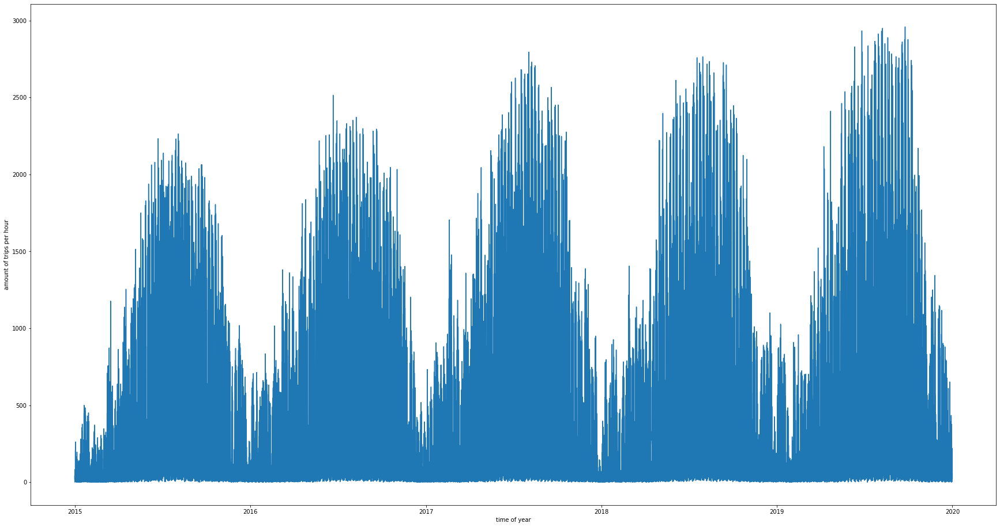

In [588]:
plt.figure(figsize=(30,16))
plt.plot(filtered_df['time_rounded'], filtered_df['trips_per_hour'])
plt.xlabel('time of year')
plt.ylabel('amount of trips per hour')

In [48]:
filtered_df['time_rounded'] = pd.to_datetime(filtered_df['time_rounded'])
filtered_df['date'] = filtered_df['time_rounded'].dt.date

daily = filtered_df.groupby('date').agg(daily_trips=("trips_per_hour","sum"))


Text(0, 0.5, 'amount of trips per day')

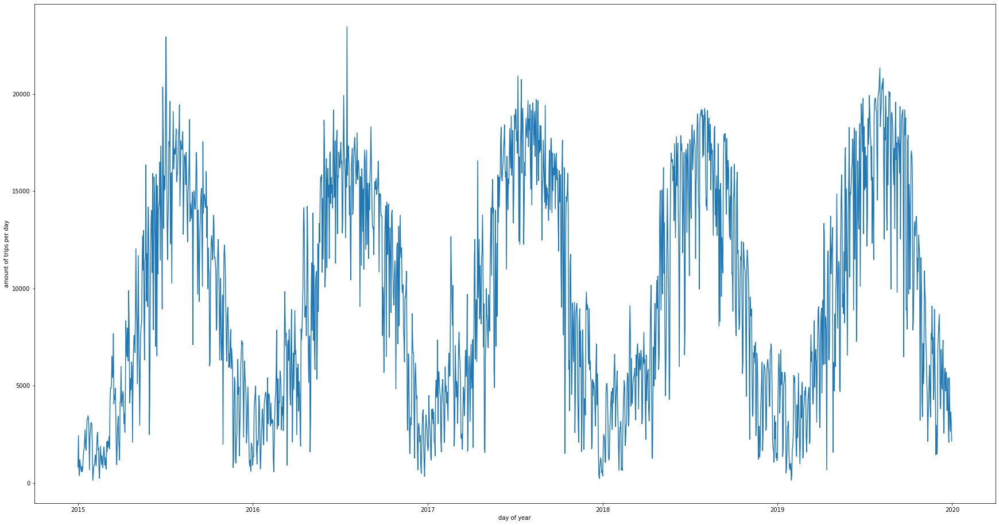

In [590]:
plt.figure(figsize=(30,16))
plt.plot(daily)
plt.xlabel('day of year')
plt.ylabel('amount of trips per day')

In [406]:
#trip_duration per hour

In [591]:
durat = chicago_data[['trip_duration', 'time_rounded', 'user_type']]

In [592]:
#convert to datetime and call hour of day and trip duration in minutes
durat['time_rounded'] = durat['time_rounded'].dt.hour
durat['trip_duration'] = durat['trip_duration'].dt.seconds.div(60)

Text(0, 0.5, 'Frequency (in Mio.)')

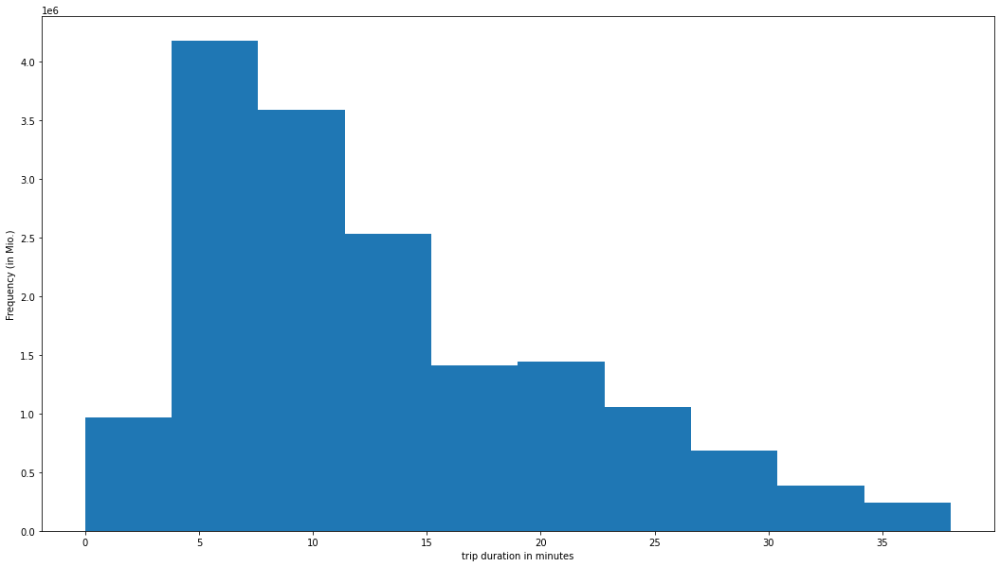

In [593]:
duration = durat['trip_duration']
plt.figure(figsize=(18,10))
duration[duration < duration.quantile(.95)].plot.hist()
plt.xlabel('trip duration in minutes')
plt.ylabel('Frequency (in Mio.)')

Text(0, 0.5, 'Frequency (in Mio.)')

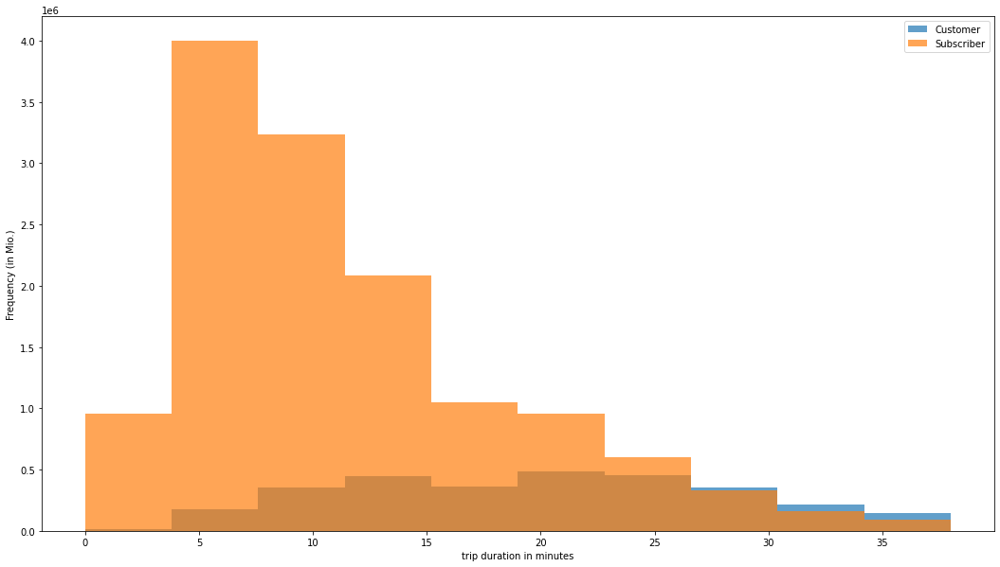

In [594]:
# trip_duration distribution by customer type
# observations: most clients seem to be subscribers already. While subscribers mostly drive relatively short distances, customers take longer routes.

plt.figure(figsize=(18,10))
#  plot histogram grouped by usertype
durat[duration < duration.quantile(.95)] \
  .groupby('user_type')['trip_duration'].plot.hist(stacked=True, legend=True, alpha=0.7)

plt.xlabel('trip duration in minutes')
plt.ylabel('Frequency (in Mio.)')

In [595]:
#average trip length per hour of day
durat_daily = durat.groupby('time_rounded').agg(mean_durat=('trip_duration', 'mean'))

Text(0, 0.5, 'mean trip duration (in minutes)')

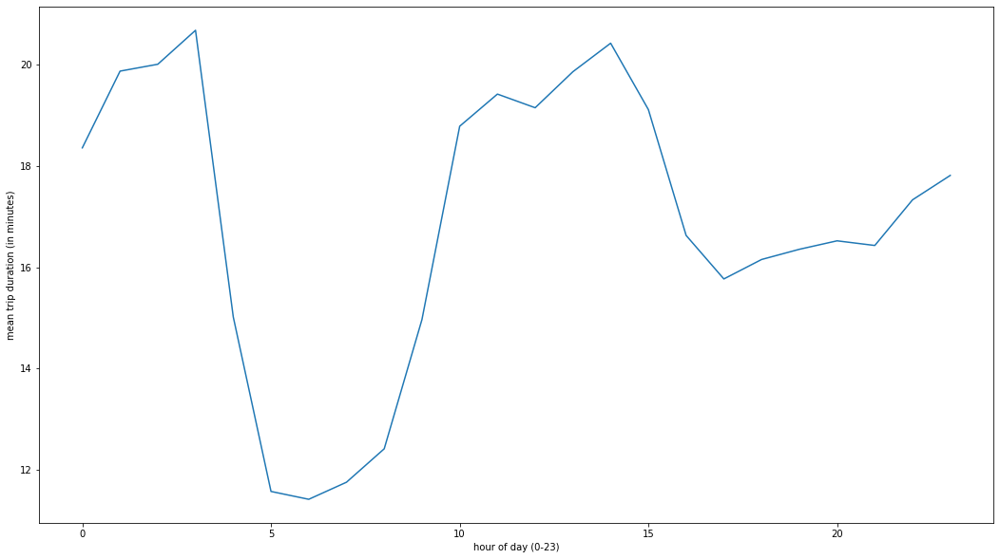

In [596]:
plt.figure(figsize=(18,10))
plt.plot(durat_daily)
plt.xlabel('hour of day (0-23)')
plt.ylabel('mean trip duration (in minutes)')

In [597]:
# average trips per day of week
# daily change in demand 
# find weekday
daily = daily.reset_index()
daily['datetime'] = pd.to_datetime(daily['date'])
daily['weekday'] = daily['datetime'].dt.weekday
daily['week'] = daily['datetime'].dt.isocalendar().week

In [598]:
daily.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1826 entries, 0 to 1825
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         1826 non-null   object        
 1   daily_trips  1826 non-null   float64       
 2   datetime     1826 non-null   datetime64[ns]
 3   weekday      1826 non-null   int64         
 4   week         1826 non-null   UInt32        
dtypes: UInt32(1), datetime64[ns](1), float64(1), int64(1), object(1)
memory usage: 66.1+ KB


Text(0, 0.5, 'average amount of trips')

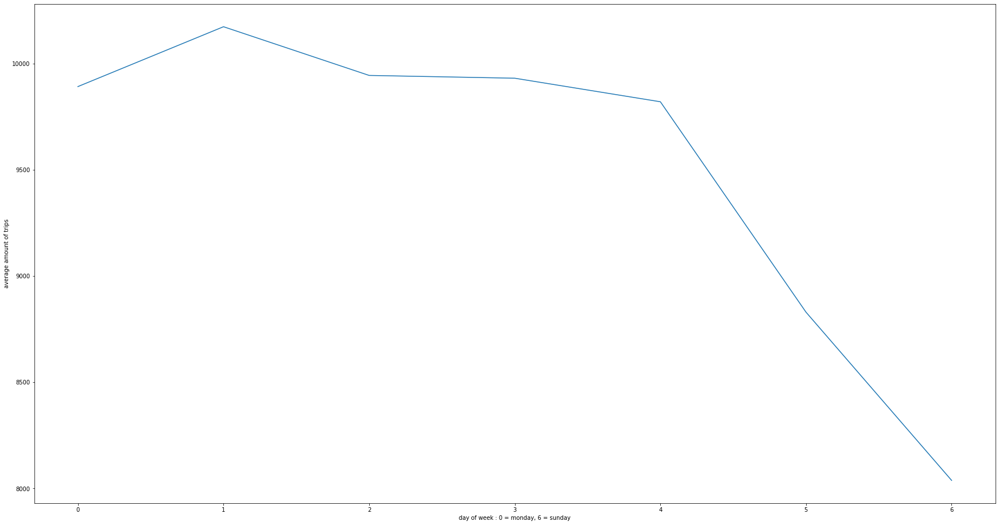

In [599]:
day_of_week = daily.groupby('weekday').agg(weekday_trips = ("daily_trips","mean"))

plt.figure(figsize=(30,16))
plt.plot(day_of_week)
plt.xlabel('day of week : 0 = monday, 6 = sunday')
plt.ylabel('average amount of trips')

In [600]:
## you can spot that, on average, fleet usage is on its highest at the beginning of the week (monday and tuesday) and then drops towards the weekend. 

In [601]:
# Lets investigate further: We know weekdays 0-4 are workdays, 5-6 are weekend.
workdays = daily[daily.weekday.isin([0,1,2,3,4])]
weekend = daily[daily.weekday.isin([5,6])]

In [602]:
weekend.head()

,date,daily_trips,datetime,weekday,week
2,2015-01-03,685.0,2015-01-03,5,1
3,2015-01-04,382.0,2015-01-04,6,1
9,2015-01-10,573.0,2015-01-10,5,2
10,2015-01-11,769.0,2015-01-11,6,2
16,2015-01-17,1840.0,2015-01-17,5,3


Text(0, 0.5, 'mean amount of trips')

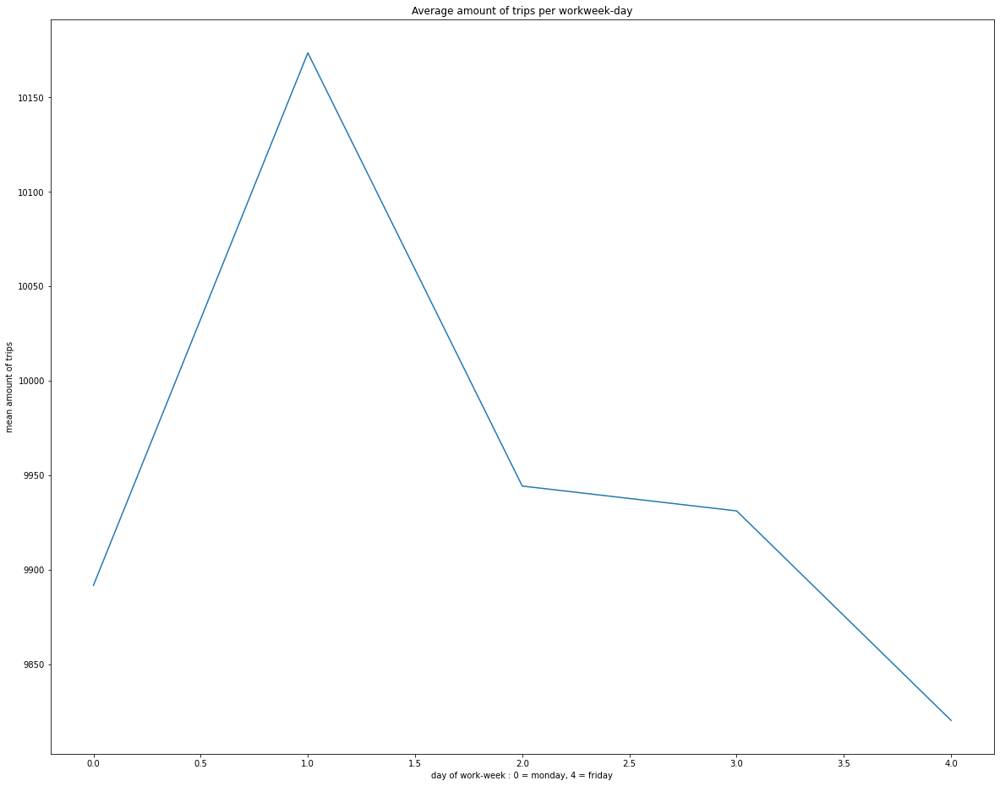

In [603]:
#Lets plot workdays

workdays_plot = workdays.groupby('weekday').agg(weekday_trips = ("daily_trips","mean"))

plt.figure(figsize=(20,16))
plt.plot(workdays_plot)
plt.title('Average amount of trips per workweek-day')
plt.xlabel('day of work-week : 0 = monday, 4 = friday')
plt.ylabel('mean amount of trips')

In [604]:
#average amount of trips are highest on workdays, Tuesday beeing the most busy day out of all.

Text(0, 0.5, 'mean amount of trips')

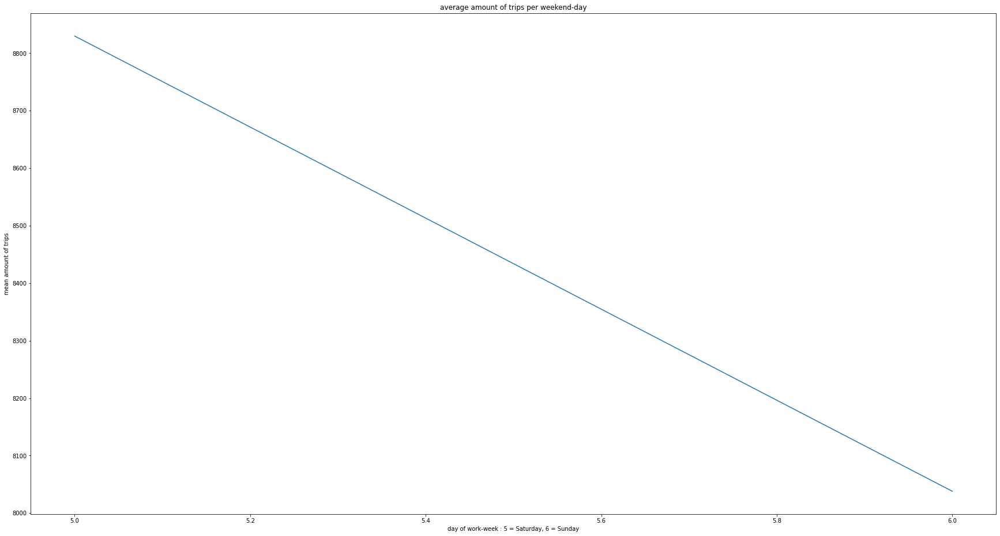

In [605]:
#Lets plot weekend

weekend_plot = weekend.groupby('weekday').agg(weekday_trips = ("daily_trips","mean"))

plt.figure(figsize=(30,16))
plt.plot(weekend_plot)
plt.title('average amount of trips per weekend-day')
plt.xlabel('day of work-week : 5 = Saturday, 6 = Sunday')
plt.ylabel('mean amount of trips')

In [606]:
#as expected, usage drops on weekend to under 8.000 trips a day, sunday beeing the least popular day.

Text(0, 0.5, 'total amount of trips (over 3 years)')

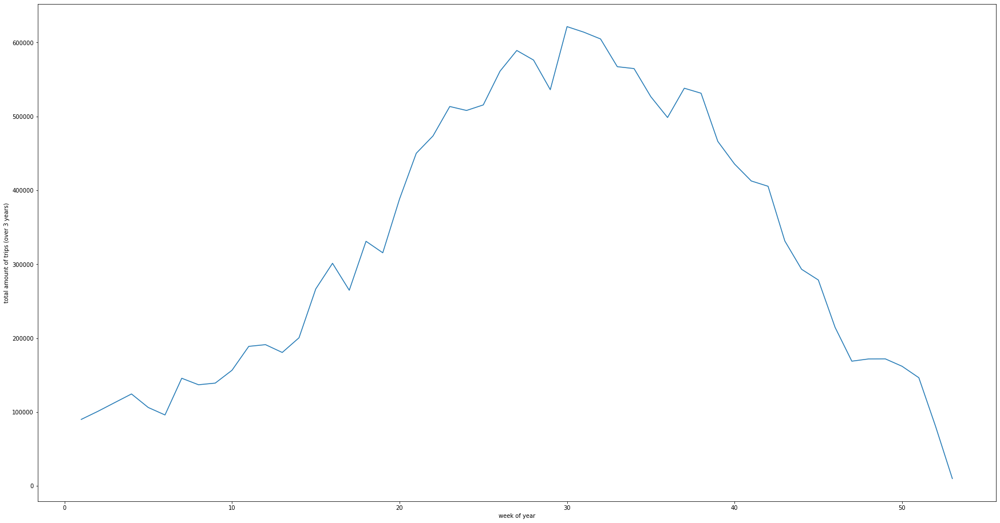

In [607]:
weekly = daily.groupby('week').agg(week_total_trips = ("daily_trips", "sum"))

plt.figure(figsize=(30,16))
plt.plot(weekly)
plt.xlabel('week of year')
plt.ylabel('total amount of trips (over 3 years)')

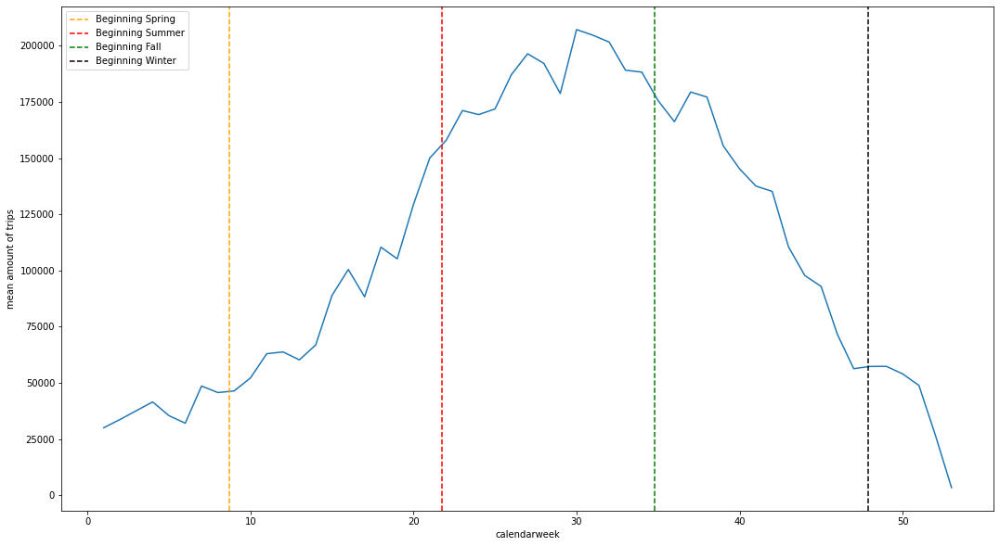

In [608]:
#mean trips are highest towards the middle of calender weeks in a year

#divide by three because 3 yeasr in dataframe
week_avg_trips = weekly['week_total_trips'].div(3)


plt.figure(figsize=(18,10))
plt.plot(week_avg_trips)

#add season marker (northern hemnisphere), Meteorological Start (x) approximately by calendar week, to provide orientation
plt.axvline(x = 8.7, label = 'Beginning Spring', color = 'orange', linestyle = '--')
plt.axvline(x = 21.75, label = 'Beginning Summer', color = 'red', linestyle = '--')
plt.axvline(x = 34.8, label = 'Beginning Fall', color = 'green', linestyle = '--')
plt.axvline(x = 47.9, label = 'Beginning Winter', color = 'black', linestyle = '--')

plt.xlabel('calendarweek')
plt.ylabel('mean amount of trips')
plt.legend(prop = {'size':10})


In [282]:
## Geographical Demand Patterns

# you can observe that no matter start or end station, there seems to be a clear popularity trend amongst the stations
# for example 'Streeter Dr & Grand Ave' station is the Navy Pier, one of the most popular tourist attractions in the city

In [43]:
chicago_data['start_station_name'].value_counts()

Streeter Dr & Grand Ave           286457
Canal St & Adams St               236795
Clinton St & Washington Blvd      231492
Clinton St & Madison St           213105
Lake Shore Dr & Monroe St         207875
                                   ...  
South Chicago Ave & Elliot Ave         9
Damen Ave & Garfield Blvd              7
Elizabeth St & 59th St                 6
Phillips Ave & 82nd St                 2
TS ~ DIVVY PARTS TESTING               1
Name: start_station_name, Length: 724, dtype: int64

In [44]:
chicago_data['end_station_name'].value_counts()

Streeter Dr & Grand Ave           329379
Canal St & Adams St               228237
Clinton St & Washington Blvd      226411
Lake Shore Dr & North Blvd        216194
Clinton St & Madison St           204855
                                   ...  
Phillips Ave & 82nd St                 7
South Chicago Ave & Elliot Ave         6
Damen Ave & Garfield Blvd              6
TS ~ DIVVY PARTS TESTING               2
BBB ~ Divvy Parts Testing              1
Name: end_station_name, Length: 725, dtype: int64

In [609]:
streets = gpd.read_file('/Users/Lukas/Downloads/Street_center_lines/geo_export_5be3973d-042a-4557-ace5-cf6a567ad6e0.shp')
streets.head()

,class,date_creat,time_creat,create_use,dir_travel,edit_date,edit_type,ewns,ewns_coord,ewns_dir,...,t_cross,t_cross_st,t_zlev,tiered,tnode_id,trans_id,date_updat,time_updat,update_use,geometry
0,4,1999-01-01,00:00:00.000,EXISTING,F,0.0,None,-232.0,232.0,W,...,6250|S|||,0.0,0.0,N,16581.0,127104.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.63187 41.78081, -87.63185 41.7..."
1,2,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,0.0,0.0,None,...,800|E|74TH|ST|,172.0,0.0,N,34082.0,128895.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.60549 41.76223, -87.60548 41.7..."
2,4,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,-2500.0,2500.0,W,...,2500|W|109TH|ST|,1805.0,0.0,N,22358.0,142645.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.68382 41.69724, -87.68381 41.6..."
3,4,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,-932.0,932.0,W,...,||DEAD END||,0.0,0.0,N,28881.0,148189.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.64584 41.69340, -87.64624 41.6..."
4,4,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,-11800.0,11800.0,S,...,11799|S|CHURCH|ST|,1214.0,0.0,N,36534.0,139728.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.67054 41.67976, -87.67071 41.6..."


In [31]:
pd.set_option('display.max_columns', None)
streets.sample(5)

,class,date_creat,time_creat,create_use,dir_travel,edit_date,edit_type,ewns,ewns_coord,ewns_dir,f_cross,f_cross_st,f_zlev,flag_strin,fnode_id,l_censusbl,l_f_add,l_fips,l_parity,l_t_add,l_zip,length,logiclf,logiclt,logicrf,logicrt,objectid,oneway_dir,pre_dir,r_censusbl,r_f_add,r_fips,r_parity,r_t_add,r_zip,shape_len,status,date_statu,time_statu,street_nam,street_typ,streetname,suf_dir,t_cross,t_cross_st,t_zlev,tiered,tnode_id,trans_id,date_updat,time_updat,update_use,geometry
29688,2,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,1600.0,1600.0,E,1599|E|66TH|PL|,156.0,0.0,None,2494.0,170314211001009,0.0,14000.0,O,0.0,None,334.421126,0.0,0.0,6632.0,6698.0,30341.0,None,S,170314211002008,6632.0,14000.0,E,6658.0,60637,334.421124,N,1999-01-01,00:00:00.000,STONY ISLAND,AVE,1727.0,None,1561|E|67TH|ST|,159.0,0.0,N,27187.0,127447.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.58632 41.77426, -87.58632 41.7..."
7472,4,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,3800.0,3800.0,N,3800|N|SHEFFIELD|AVE|,1010.0,0.0,None,8342.0,170310611001000,1001.0,14000.0,O,1027.0,60613,328.721881,1001.0,1031.0,1000.0,1030.0,6954.0,None,W,170310606001003,1000.0,14000.0,E,1026.0,60613,328.721919,N,1999-01-01,00:00:00.000,GRACE,ST,2264.0,None,3800|N|KENMORE|AVE|,578.0,0.0,N,8343.0,102685.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.65444 41.95112, -87.65506 41.9..."
25163,4,1999-01-01,00:00:00.000,EXISTING,T,0.0,None,-8000.0,8000.0,S,8000|S|STATE|ST|,1719.0,0.0,None,14365.0,170314403005001,2.0,14000.0,E,36.0,60619,417.612349,2.0,42.0,1.0,41.0,24768.0,W,E,170314403005002,1.0,14000.0,O,35.0,60619,417.612371,N,1999-01-01,00:00:00.000,80TH,ST,184.0,None,8000|S|WABASH|AVE|,1754.0,0.0,N,15632.0,130307.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.62448 41.74912, -87.62390 41.7..."
23791,2,1999-01-01,00:00:00.000,EXISTING,B,0.0,None,-3200.0,3200.0,W,3200|W|GRACE|ST|,2264.0,0.0,None,31598.0,170311608001003,3800.0,14000.0,E,3858.0,60618,665.880646,3800.0,3898.0,3801.0,3899.0,24381.0,None,N,170311607005003,3801.0,14000.0,O,3859.0,60618,665.880636,N,1999-01-01,00:00:00.000,KEDZIE,AVE,570.0,None,3200|W|BYRON|ST|,2076.0,0.0,N,7864.0,110932.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.70792 41.95028, -87.70793 41.9..."
43748,4,1999-01-01,00:00:00.000,EXISTING,F,0.0,None,-1400.0,1400.0,S,1400|S|KENNETH|AVE|,1482.0,0.0,None,34243.0,170312909003004,4433.0,14000.0,O,4459.0,60623,333.185033,4433.0,4499.0,4430.0,4498.0,43539.0,W,W,170312909004004,4430.0,14000.0,E,4458.0,60623,333.185047,N,1999-01-01,00:00:00.000,14TH,ST,1845.0,None,1400|S|KILBOURN|AVE|,1486.0,0.0,N,10388.0,123821.0,1999-01-01,00:00:00.000,EXISTING,"LINESTRING (-87.73607 41.86236, -87.73627 41.8..."


In [610]:
stations = pd.read_csv('/Users/Lukas/Downloads/Divvy_Bicycle_Stations_-_All_-_Map.csv')


In [190]:
stations.head()

,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location
0,373,Kedzie Ave & Chicago Ave,11,11,In Service,41.895465,-87.706128,"(41.89546530305, -87.7061278837)"
1,102,Stony Island Ave & 67th St,11,11,In Service,41.773458,-87.585340,"(41.77345849948, -87.5853397391)"
2,438,Central Park Ave & Ogden Ave,15,15,In Service,41.854064,-87.715117,"(41.854063503874464, -87.71511733531952)"
3,656,Damen Ave & Walnut (Lake) St,15,15,In Service,41.885951,-87.677009,"(41.885951, -87.677009)"
4,560,Marshfield Ave & 59th St,11,11,In Service,41.786833,-87.666215,"(41.786833, -87.666215)"


In [611]:
#get location Data by using Point
geometry = [Point (xy) for xy in zip(stations['Longitude'], stations['Latitude'])]

In [35]:
#checking
geometry[:5]

In [612]:
#create geodataframe with stations and their geometry we just calculated
stations_geo = gpd.GeoDataFrame(stations, geometry = geometry)
stations_geo.head()

,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location,geometry
0,373,Kedzie Ave & Chicago Ave,11,11,In Service,41.895465,-87.706128,"(41.89546530305, -87.7061278837)",POINT (-87.70613 41.89547)
1,102,Stony Island Ave & 67th St,11,11,In Service,41.773458,-87.585340,"(41.77345849948, -87.5853397391)",POINT (-87.58534 41.77346)
2,438,Central Park Ave & Ogden Ave,15,15,In Service,41.854064,-87.715117,"(41.854063503874464, -87.71511733531952)",POINT (-87.71512 41.85406)
3,656,Damen Ave & Walnut (Lake) St,15,15,In Service,41.885951,-87.677009,"(41.885951, -87.677009)",POINT (-87.67701 41.88595)
4,560,Marshfield Ave & 59th St,11,11,In Service,41.786833,-87.666215,"(41.786833, -87.666215)",POINT (-87.66622 41.78683)


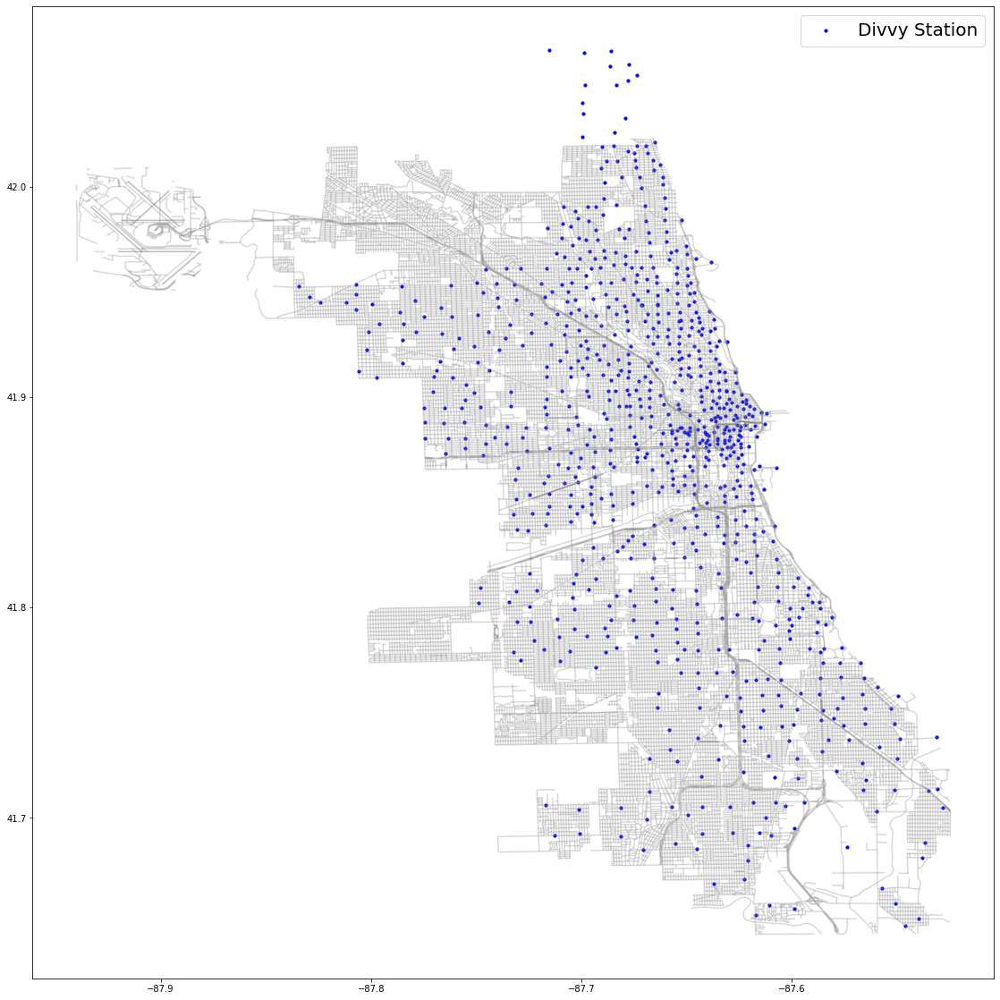

In [613]:
#plot of divvy stations on chicago street shapefile
fig, ax = plt.subplots(figsize = (35,20))
streets.plot(ax = ax, alpha=0.3, color= 'grey')
stations_geo.plot(ax = ax, marker='o', markersize = 10, color='blue', label = 'Divvy Station')
plt.legend(prop = {'size':20})

In [39]:
#observations: divvy stations are clearly concentraded towards the city centre and even the seaside
#part of the shapefile seems to be missing, the missing district is called 'Evanston'

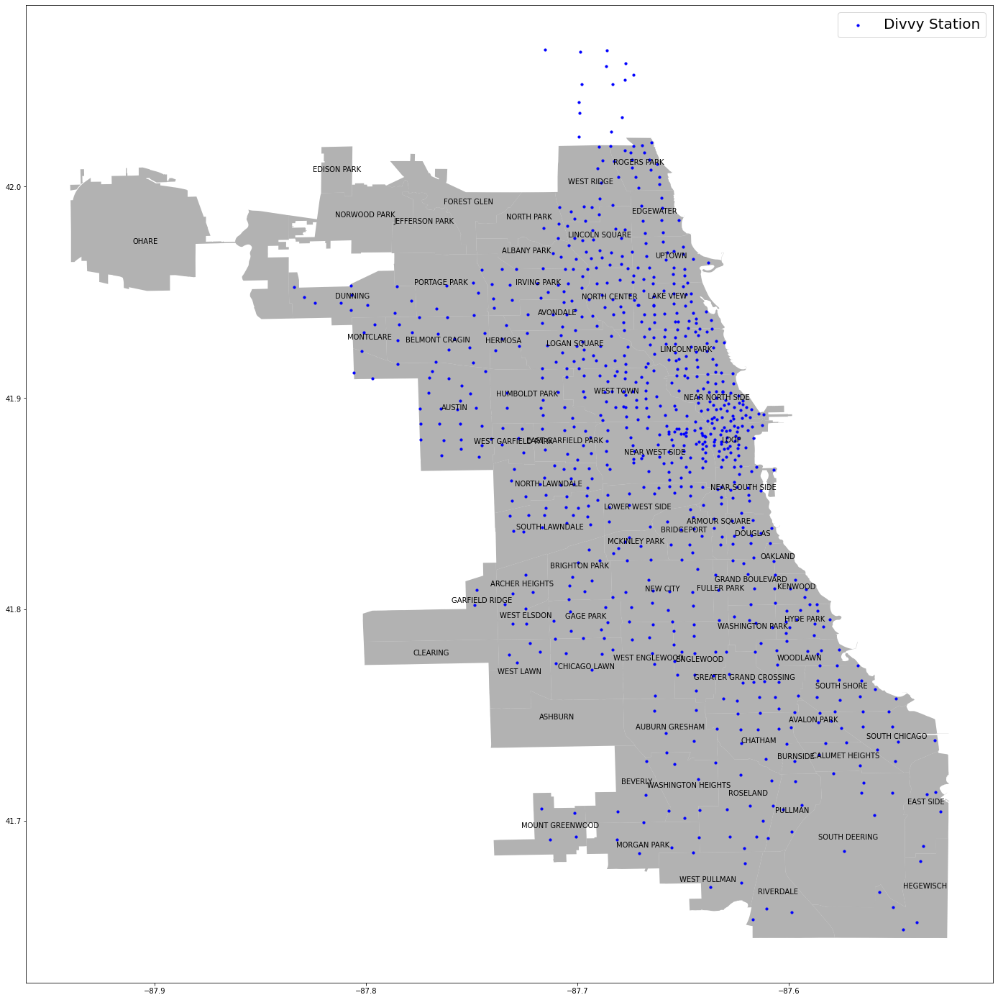

In [614]:
#plot stations against city districts
districts = gpd.read_file('/Users/Lukas/Downloads/Boundaries - Community Areas (current)-2/geo_export_5e9bdce9-952c-4fb4-85ea-cebefa5c92ef.shp')
#find random coordinate in Polygon to position district label later on
districts['coords'] = districts['geometry'].apply(lambda x: x.representative_point().coords[:])
districts['coords'] = [coords[0] for coords in districts['coords']]  
fig, ax = plt.subplots(figsize = (40,25))

districts.plot(ax = ax, alpha=0.6, color= 'grey')
stations_geo.plot(ax = ax, marker='o', markersize = 10, color='blue', label = 'Divvy Station')
plt.legend(prop = {'size':20})

#annotate community name for every district at estimated coords
for index, row in districts.iterrows():
    plt.annotate(s=row['community'], xy=row['coords'],
                 horizontalalignment='center', fontsize='10', color='black')


In [ ]:
## observations: the highest concentration of Divvy Stations is found in the districts 'Near North Side', 'Loop', 'Near South Side', 'Lincoln Park', 'Lake View', etc.
# This makes sense considering lake michigan is located to the east of the above map. The lakeside includes multiple beaches, the navy pier, multiple museums, tourist attractions and of course provides for a beautiful skyline.

In [615]:
# heatmap of trips 

# lets merge dateaframes on Divvy station Id
chicago_geo = pd.merge(chicago_data,stations_geo,left_on=['start_station_id'], right_on = ['ID'], how = 'left')
          

In [618]:
#16685 NaN rows remain, lets drop them
chicago_geo.isna().sum()

start_time                0
end_time                  0
start_station_id          0
end_station_id            0
start_station_name        0
end_station_name          0
bike_id                   0
user_type                 0
start                     0
end                       0
time_rounded              0
weekday                   0
week                      0
month                     0
day_of_month              0
hour_of_day               0
trip_duration             0
date                      0
trips_per_hour            0
ID                    16685
Station Name          16685
Total Docks           16685
Docks in Service      16685
Status                16685
Latitude              16685
Longitude             16685
Location              16685
geometry              16685
dtype: int64

In [619]:
chicago_geo = chicago_geo.dropna(axis=0, how="any")

In [620]:
chicago_geo.isna().sum()

start_time            0
end_time              0
start_station_id      0
end_station_id        0
start_station_name    0
end_station_name      0
bike_id               0
user_type             0
start                 0
end                   0
time_rounded          0
weekday               0
week                  0
month                 0
day_of_month          0
hour_of_day           0
trip_duration         0
date                  0
trips_per_hour        0
ID                    0
Station Name          0
Total Docks           0
Docks in Service      0
Status                0
Latitude              0
Longitude             0
Location              0
geometry              0
dtype: int64

In [346]:
chicago_geo.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,end,time_rounded,weekday,week,trip_duration,date,trips_per_hour,ID,Station Name,Total Docks,Docks in Service,Status,Latitude,Longitude,Location,geometry
0,3/31/2017 23:59:07,4/1/2017 00:13:24,66,171,Clinton St & Lake St,May St & Cullerton St,5292,Subscriber,2017-03-31 23:59:07,2017-04-01 00:13:24,2017-03-31 23:00:00,4,13,0 days 00:14:17,2017-03-31,49,66.0,Clinton St & Lake St,23.0,23.0,In Service,41.885637,-87.641823,"(41.885637, -87.641823)",POINT (-87.64182 41.88564)
1,3/31/2017 23:56:25,4/1/2017 00:00:21,199,26,Wabash Ave & Grand Ave,McClurg Ct & Illinois St,4408,Subscriber,2017-03-31 23:56:25,2017-04-01 00:00:21,2017-03-31 23:00:00,4,13,0 days 00:03:56,2017-03-31,49,199.0,Wabash Ave & Grand Ave,31.0,31.0,In Service,41.891466,-87.626761,"(41.891466, -87.626761)",POINT (-87.62676 41.89147)
2,3/31/2017 23:55:33,4/1/2017 00:01:21,520,432,Greenview Ave & Jarvis Ave,Clark St & Lunt Ave,696,Subscriber,2017-03-31 23:55:33,2017-04-01 00:01:21,2017-03-31 23:00:00,4,13,0 days 00:05:48,2017-03-31,49,520.0,Greenview Ave & Jarvis Ave,19.0,19.0,In Service,42.015962,-87.668570,"(42.015962, -87.66857)",POINT (-87.66857 42.01596)
3,3/31/2017 23:54:46,3/31/2017 23:59:34,110,142,Dearborn St & Erie St,McClurg Ct & Erie St,4915,Subscriber,2017-03-31 23:54:46,2017-03-31 23:59:34,2017-03-31 23:00:00,4,13,0 days 00:04:48,2017-03-31,49,110.0,Dearborn St & Erie St,27.0,27.0,In Service,41.893992,-87.629318,"(41.893992, -87.629318)",POINT (-87.62932 41.89399)
4,3/31/2017 23:53:33,4/1/2017 00:00:28,327,331,Sheffield Ave & Webster Ave,Halsted St & Blackhawk St (*),4247,Subscriber,2017-03-31 23:53:33,2017-04-01 00:00:28,2017-03-31 23:00:00,4,13,0 days 00:06:55,2017-03-31,49,327.0,Sheffield Ave & Webster Ave,19.0,19.0,In Service,41.921540,-87.653818,"(41.92154, -87.653818)",POINT (-87.65382 41.92154)


In [621]:
heatmap_df = chicago_geo[['Longitude','Latitude']]

In [622]:
heatmap_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17363695 entries, 0 to 17380379
Data columns (total 2 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Longitude  float64
 1   Latitude   float64
dtypes: float64(2)
memory usage: 397.4 MB


<AxesSubplot:xlabel='Longitude', ylabel='Latitude'>

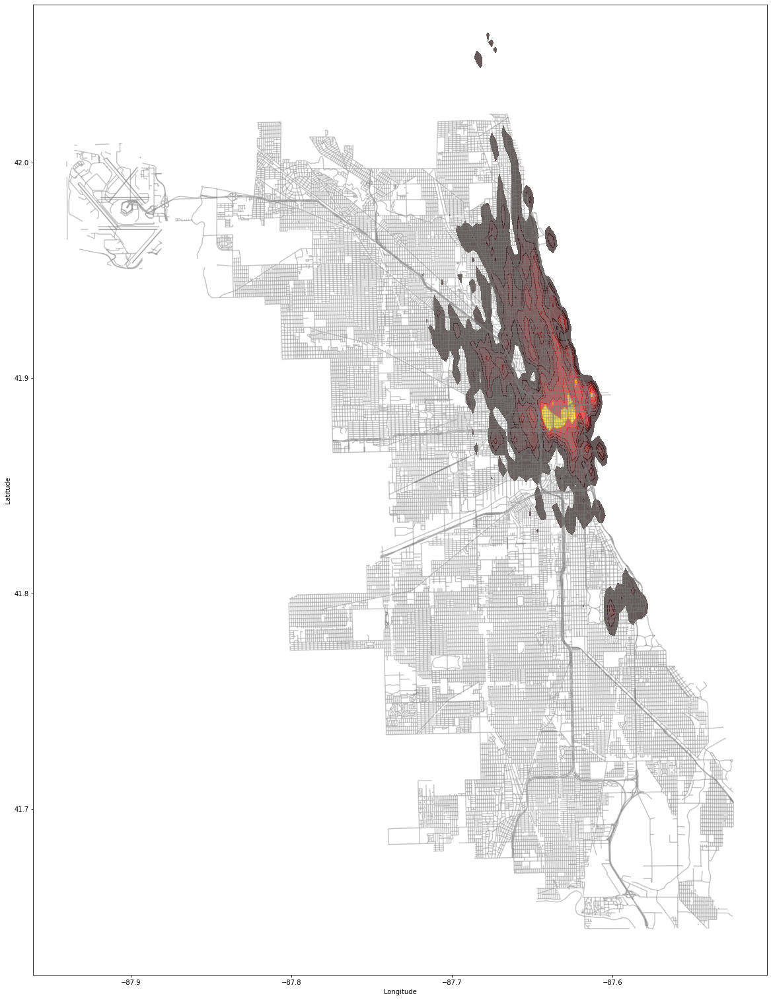

In [623]:
# plot heatmap with 4 Mio. sample of dataset because of computing time
fig, ax = plt.subplots(figsize = (40,27))
streets.plot(ax = ax, alpha=0.45, color= 'grey')
sns.kdeplot(ax = ax,
            data = heatmap_df.sample(4000000),
            x = 'Longitude', 
            y = 'Latitude', 
            fill = True, 
            gridsize = 100,
            levels = 8,
            shade = True,
            cmap = "hot",
            alpha = 0.65)

In [624]:
# over 205 station ids seem to not have been used once as starting point
stations['ID'].nunique() - chicago_data['start_station_id'].nunique()

205

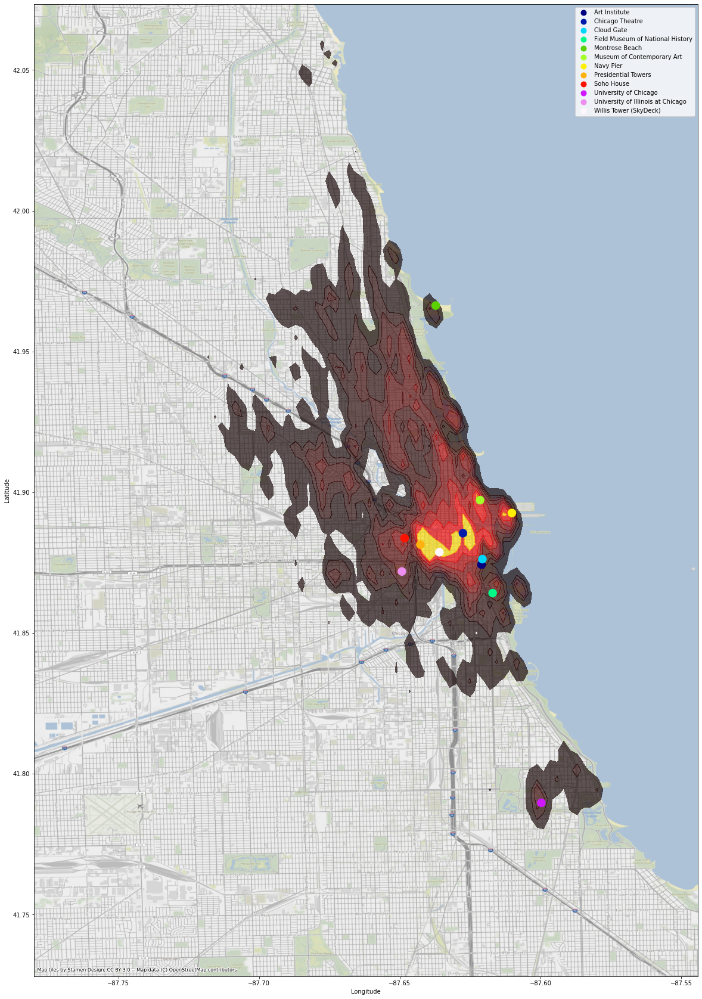

In [625]:
#find coordinates of attractions
attractions = [{'Name': 'Navy Pier',
                "Longitude" :-87.610168,
                "Latitude":41.892654}, #Navy Pier
               {'Name': 'University of Chicago',
                "Longitude" :-87.599724,
                "Latitude":41.789722}, #University of Chicago
               {'Name': 'University of Illinois at Chicago',
                "Longitude":-87.64925,
                'Latitude': 41.871889},#University of Illinois at Chicago
               {'Name': 'Soho House',
                "Longitude": -87.648307,
                'Latitude': 41.88374},#Soho House
               {'Name': 'Presidential Towers',
                "Longitude": -87.6426838,
                'Latitude': 41.8814362},#Presidential Towers
               {'Name': 'Chicago Theatre',
                "Longitude": -87.627569,
                'Latitude': 41.885485},# Chicago Theatre
               {'Name': 'Art Institute',
                "Longitude": -87.620997516,
                'Latitude': 41.874329836},# Art Institute
                {'Name': 'Montrose Beach',
                "Longitude": -87.637233,
                'Latitude': 41.966331},#Montrose Beach
               {'Name': 'Field Museum of National History',
                "Longitude": -87.617020,
                'Latitude': 41.864193},#Field Museum of National History
               {'Name': 'Museum of Contemporary Art',
                "Longitude": -87.621474,
                'Latitude': 41.897215 },#Museum of Contemporary Art
               {'Name': 'Cloud Gate',
                "Longitude": -87.620659184,
                'Latitude': 41.8762748282 },#Cloud Gate
               {'Name': 'Willis Tower (SkyDeck)',
                "Longitude": -87.635943,
                'Latitude': 41.878741}]#Willis Tower (SkyDeck)



# load into dataframe
attractions1 = pd.DataFrame(attractions, index = [1,2,3,4,5,6,7,8,9,10,11,12])

#calculate Point data for attractions
geometry_attrac = [Point (xy) for xy in zip(attractions1['Longitude'], attractions1['Latitude'])]

#create Geodataframe 
attrac = gpd.GeoDataFrame(attractions1, crs={"init":"epsg:4326"}, geometry = geometry_attrac)

#plot
fig, ax = plt.subplots(figsize = (50,30))

attrac.plot(ax = ax, marker = 'o', markersize=180,  zorder=7, column = 'Name', legend=True, cmap='gist_ncar')

sns.kdeplot(ax = ax,
            data = heatmap_df.sample(4000000),
            x = 'Longitude', 
            y = 'Latitude', 
            fill = True, 
            gridsize = 100,
            levels = 9,
            shade = True,
            cmap = "hot",
            alpha = 0.65)

ctx.add_basemap(ax = ax, crs = 4326, alpha = 0.8, zoom = 14)

In [626]:
# lets merge dateaframes on Divvy station Id and end
chicago_geo_end_st = pd.merge(chicago_data,stations_geo,left_on=['end_station_id'], right_on = ['ID'], how = 'left')

In [627]:
#6322 NaN rows remain, lets drop them
chicago_geo_end_st.isna().sum()

start_time                0
end_time                  0
start_station_id          0
end_station_id            0
start_station_name        0
end_station_name          0
bike_id                   0
user_type                 0
start                     0
end                       0
time_rounded              0
weekday                   0
week                      0
month                     0
day_of_month              0
hour_of_day               0
trip_duration             0
date                      0
trips_per_hour            0
ID                    17194
Station Name          17194
Total Docks           17194
Docks in Service      17194
Status                17194
Latitude              17194
Longitude             17194
Location              17194
geometry              17194
dtype: int64

In [628]:
chicago_geo_end_st = chicago_geo_end_st.dropna(axis=0, how="any")

In [629]:
heatmap_df_end = chicago_geo_end_st[['Longitude','Latitude']]

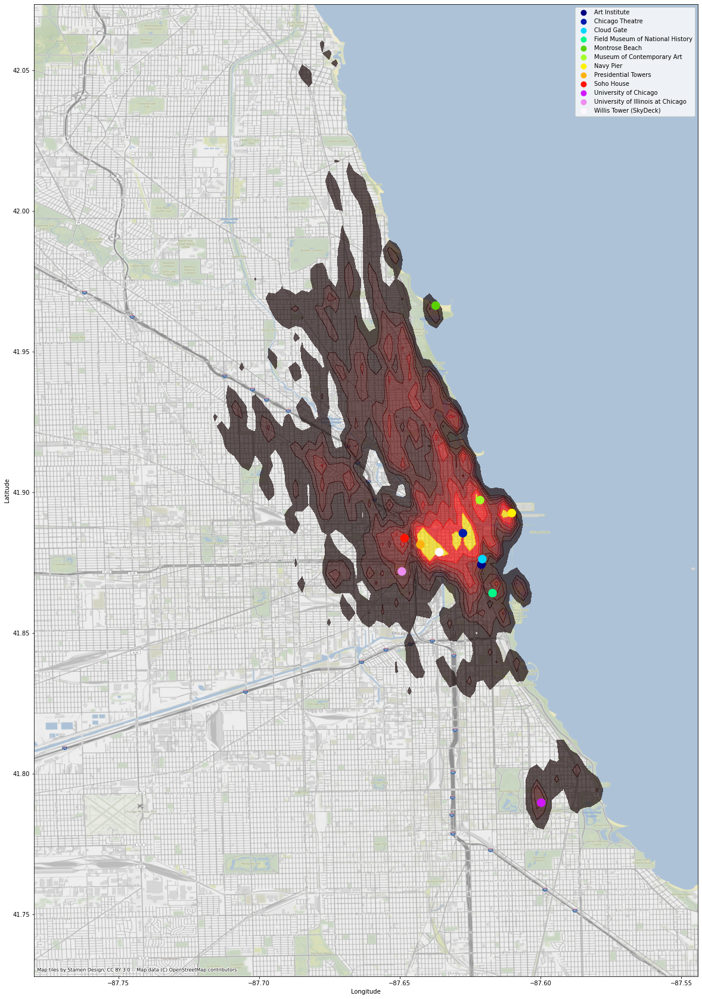

In [630]:
#iterate step for end stations
# minimal differences between start and end heatmaps can be observed

#plot
fig, ax = plt.subplots(figsize = (50,30))

#plot attractions legend and markers
attrac.plot(ax = ax, marker = 'o', markersize=180,  zorder=7, column = 'Name', legend=True, cmap='gist_ncar')

sns.kdeplot(ax = ax,
            data = heatmap_df_end.sample(4000000),
            x = 'Longitude', 
            y = 'Latitude', 
            fill = True, 
            gridsize = 100,
            levels = 9,
            shade = True,
            cmap = "hot",
            alpha = 0.65)

ctx.add_basemap(ax = ax, crs = 4326, alpha = 0.8, zoom = 14)

In [ ]:
##add KPIs

In [ ]:
#revenue_per_hour
#revenue_per_day
#fleet_utilization_per_day

In [631]:
# To calculate revenue, take a look at Divvys pricing (https://www.divvybikes.com/pricing)

#For customers: (Single Ride, $3.30/trip, One trip up to 30 minutes)
chicago_data['revenue'] = np.ceil((chicago_data.trip_duration.dt.total_seconds()/60) /30) * 3.3
#For subscribers:(annaual membership, 9$/month, Unlimited 45-min rides)
#assuming every subscription is first login


In [632]:
daily_rev = chicago_data.groupby('date').agg(daily_revenue=("revenue","sum"))
daily_rev_per_bike = daily_rev/chicago_data['bike_id'].nunique()
#fleet_size needs to be calculated differently

Text(0, 0.5, 'daily revenue (in $) per bike')

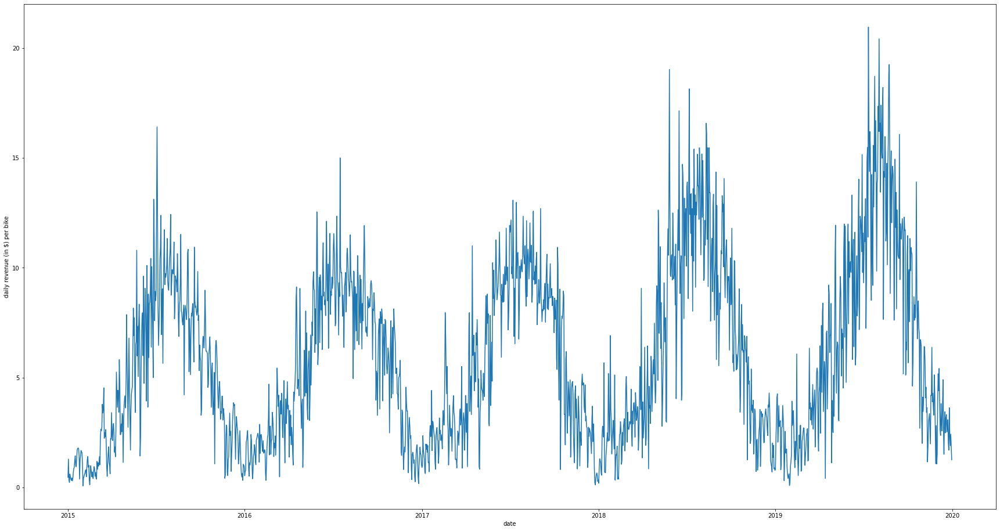

In [633]:
#revenue per bike
plt.figure(figsize=(30,16))
plt.plot(daily_rev_per_bike)
plt.xlabel('date')
plt.ylabel('daily revenue (in $) per bike')

In [634]:
heatmap_workdays = chicago_geo[chicago_geo.weekday.isin([0,1,2,3,4])]
heatmap_weekend = chicago_geo[chicago_geo.weekday.isin([5,6])]

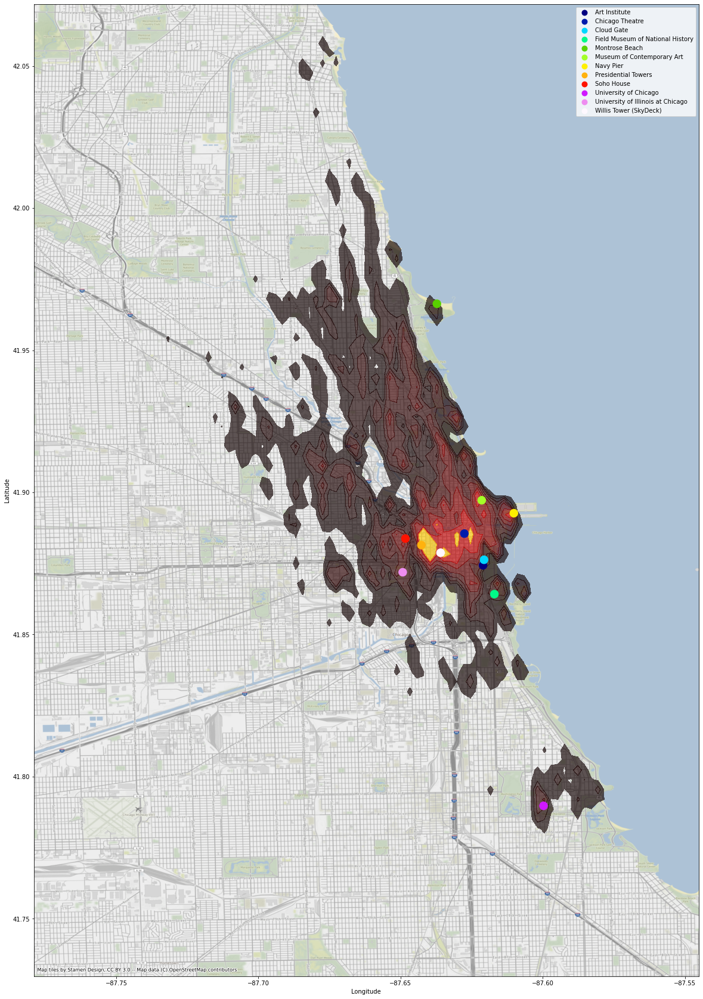

In [635]:
#plot workdays heatmap
fig, ax = plt.subplots(figsize = (50,30))

#plot attractions legend and markers
attrac.plot(ax = ax, marker = 'o', markersize=180,  zorder=7, column = 'Name', legend=True, cmap='gist_ncar')

sns.kdeplot(ax = ax,
            data = heatmap_workdays,
            x = 'Longitude', 
            y = 'Latitude', 
            fill = True, 
            gridsize = 100,
            levels = 9,
            shade = True,
            cmap = "hot",
            alpha = 0.65)

ctx.add_basemap(ax = ax, crs = 4326, alpha = 0.8, zoom = 14)

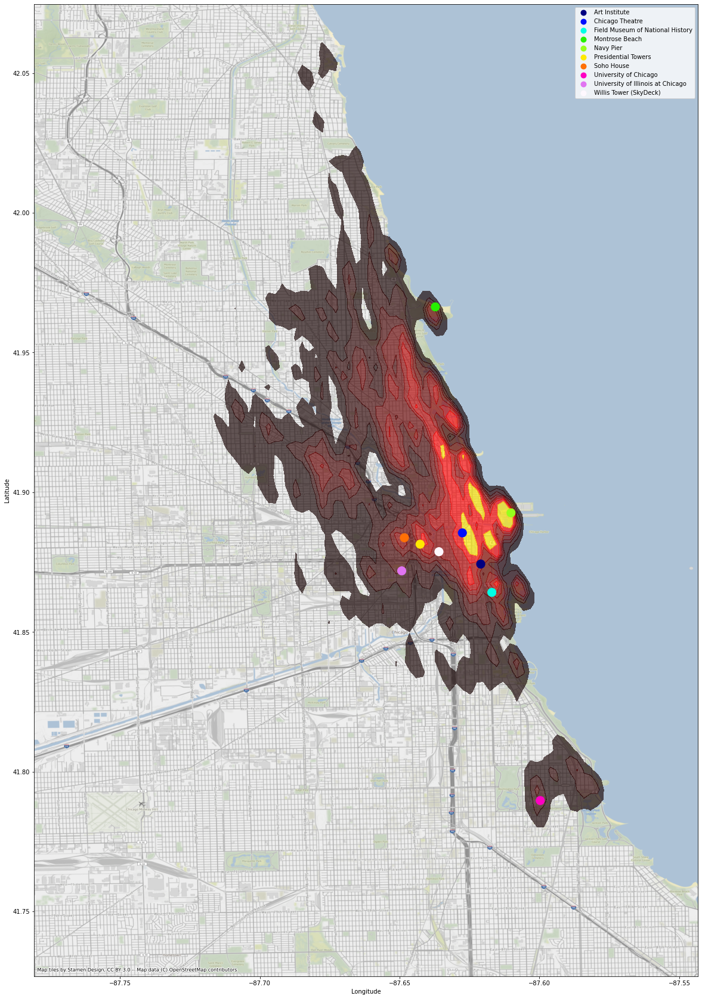

In [205]:
#plot weekend heatmap
fig, ax = plt.subplots(figsize = (50,30))

#plot attractions legend and markers
attrac.plot(ax = ax, marker = 'o', markersize=180,  zorder=7, column = 'Name', legend=True, cmap='gist_ncar')

sns.kdeplot(ax = ax,
            data = heatmap_weekend,
            x = 'Longitude', 
            y = 'Latitude', 
            fill = True, 
            gridsize = 100,
            levels = 9,
            shade = True,
            cmap = "hot",
            alpha = 0.65)

ctx.add_basemap(ax = ax, crs = 4326, alpha = 0.8, zoom = 14)

In [208]:
##Prepare Dataset for Clustering and ML


In [49]:
#merge datasets on datetime64 time columns
chicago_final = pd.merge(filtered_df,weather_data,left_on=['time_rounded'], right_on = ['index'], how = 'left')

In [656]:
chicago_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43824 entries, 0 to 43823
Data columns (total 23 columns):
 #   Column              Non-Null Count  Dtype          
---  ------              --------------  -----          
 0   time_rounded        43824 non-null  datetime64[ns] 
 1   start_time          43686 non-null  object         
 2   end_time            43686 non-null  object         
 3   start_station_id    43686 non-null  float64        
 4   end_station_id      43686 non-null  float64        
 5   start_station_name  43686 non-null  object         
 6   end_station_name    43686 non-null  object         
 7   bike_id             43686 non-null  float64        
 8   user_type           43686 non-null  object         
 9   start               43686 non-null  datetime64[ns] 
 10  end                 43686 non-null  datetime64[ns] 
 11  weekday             43824 non-null  float64        
 12  week                43824 non-null  UInt32         
 13  month               43824 non-n

In [696]:
# NaNs in columns! (because we couldn't impute geodata or station names)
chicago_final.isna().sum()

time_rounded            0
start_time            138
end_time              138
start_station_id      138
end_station_id        138
start_station_name    138
end_station_name      138
bike_id               138
user_type             138
start                 138
end                   138
weekday                 0
week                    0
month                   0
day_of_month            0
hour_of_day             0
trip_duration         138
date                    0
trips_per_hour          0
index                   0
max_temp                0
min_temp                0
precip                  0
dtype: int64

<AxesSubplot:>

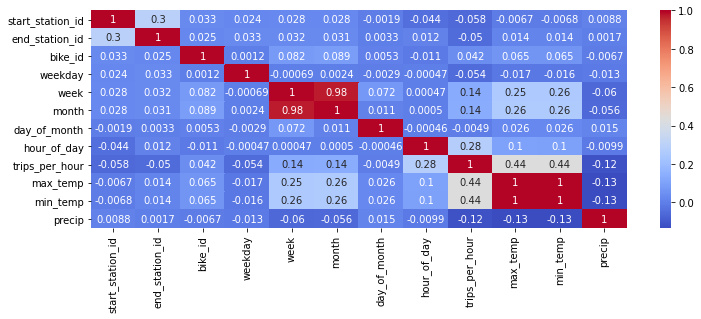

In [676]:
##Feature Engeneering
fig,ax  = plt.subplots(figsize=(12,4))
sns.heatmap(chicago_final.corr(), annot=True,cmap ="coolwarm",ax=ax)

In [50]:
#add weekday dummy
weekday = chicago_final['weekday'] <= 4

chicago_final.loc[:,"IsWeekday"] = weekday

In [678]:
chicago_final.head()

,time_rounded,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,...,day_of_month,hour_of_day,trip_duration,date,trips_per_hour,index,max_temp,min_temp,precip,IsWeekday
0,2015-01-01 00:00:00,1/1/2015 0:54,1/1/2015 1:02,54.0,128.0,Ogden Ave & Chicago Ave,Damen Ave & Chicago Ave,2688.0,Subscriber,2015-01-01 00:54:00,...,1.0,0.0,0 days 00:08:00,2015-01-01,21.0,NaT,NaN,NaN,NaN,True
1,2015-01-01 01:00:00,1/1/2015 1:57,1/1/2015 2:08,115.0,190.0,Sheffield Ave & Wellington Ave,Southport Ave & Wrightwood Ave,750.0,Subscriber,2015-01-01 01:57:00,...,1.0,1.0,0 days 00:11:00,2015-01-01,43.0,NaT,NaN,NaN,NaN,True
2,2015-01-01 02:00:00,1/1/2015 2:59,1/1/2015 3:05,340.0,143.0,Clark St & Wrightwood Ave,Sedgwick St & Webster Ave,2702.0,Subscriber,2015-01-01 02:59:00,...,1.0,2.0,0 days 00:06:00,2015-01-01,29.0,NaT,NaN,NaN,NaN,True
3,2015-01-01 03:00:00,1/1/2015 3:59,1/1/2015 4:04,337.0,176.0,Clark St & Chicago Ave,Clark St & Elm St,2706.0,Subscriber,2015-01-01 03:59:00,...,1.0,3.0,0 days 00:05:00,2015-01-01,13.0,NaT,NaN,NaN,NaN,True
4,2015-01-01 04:00:00,1/1/2015 4:05,1/1/2015 4:09,128.0,285.0,Damen Ave & Chicago Ave,Wood St & Grand Ave,2258.0,Subscriber,2015-01-01 04:05:00,...,1.0,4.0,0 days 00:04:00,2015-01-01,1.0,NaT,NaN,NaN,NaN,True


In [51]:
# drop columns not needed for next steps (this will also fix NaNs)
#as you can see, max and min temp per hour correlate by 1, so we delete min_temp also
chicago_final = chicago_final.drop(columns=['user_type','date','month','trip_duration','min_temp','start_time', 'end_time', 'start', 'end', 'start_station_id','start_station_name', 'end_station_id','end_station_name', 'bike_id', 'index'])

In [700]:
#final df
chicago_final.isna().sum()

time_rounded      0
weekday           0
week              0
day_of_month      0
hour_of_day       0
trips_per_hour    0
max_temp          0
precip            0
IsWeekday         0
dtype: int64

In [673]:
chicago_final.head(100)

,time_rounded,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,start,...,month,day_of_month,hour_of_day,trip_duration,date,trips_per_hour,index,max_temp,min_temp,precip
0,2015-01-01 00:00:00,1/1/2015 0:54,1/1/2015 1:02,54.0,128.0,Ogden Ave & Chicago Ave,Damen Ave & Chicago Ave,2688.0,Subscriber,2015-01-01 00:54:00,...,1.0,1.0,0.0,0 days 00:08:00,2015-01-01,21.0,NaT,NaN,NaN,NaN
1,2015-01-01 01:00:00,1/1/2015 1:57,1/1/2015 2:08,115.0,190.0,Sheffield Ave & Wellington Ave,Southport Ave & Wrightwood Ave,750.0,Subscriber,2015-01-01 01:57:00,...,1.0,1.0,1.0,0 days 00:11:00,2015-01-01,43.0,NaT,NaN,NaN,NaN
2,2015-01-01 02:00:00,1/1/2015 2:59,1/1/2015 3:05,340.0,143.0,Clark St & Wrightwood Ave,Sedgwick St & Webster Ave,2702.0,Subscriber,2015-01-01 02:59:00,...,1.0,1.0,2.0,0 days 00:06:00,2015-01-01,29.0,NaT,NaN,NaN,NaN
3,2015-01-01 03:00:00,1/1/2015 3:59,1/1/2015 4:04,337.0,176.0,Clark St & Chicago Ave,Clark St & Elm St,2706.0,Subscriber,2015-01-01 03:59:00,...,1.0,1.0,3.0,0 days 00:05:00,2015-01-01,13.0,NaT,NaN,NaN,NaN
4,2015-01-01 04:00:00,1/1/2015 4:05,1/1/2015 4:09,128.0,285.0,Damen Ave & Chicago Ave,Wood St & Grand Ave,2258.0,Subscriber,2015-01-01 04:05:00,...,1.0,1.0,4.0,0 days 00:04:00,2015-01-01,1.0,NaT,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2015-01-04 23:00:00,1/4/2015 23:59,1/5/2015 0:05,325.0,344.0,Clark St & Winnemac Ave,Ravenswood Ave & Lawrence Ave,504.0,Subscriber,2015-01-04 23:59:00,...,1.0,4.0,23.0,0 days 00:06:00,2015-01-04,5.0,2015-01-04 23:00:00,-9.75,-10.3,0.0
96,2015-01-05 00:00:00,1/5/2015 0:49,1/5/2015 1:04,173.0,5.0,Mies van der Rohe Way & Chicago Ave,State St & Harrison St,657.0,Subscriber,2015-01-05 00:49:00,...,1.0,5.0,0.0,0 days 00:15:00,2015-01-05,4.0,2015-01-05 00:00:00,-10.60,-10.6,0.0
97,2015-01-05 01:00:00,1/5/2015 1:40,1/5/2015 1:49,227.0,232.0,Southport Ave & Waveland Ave,Pine Grove Ave & Waveland Ave,2874.0,Subscriber,2015-01-05 01:40:00,...,1.0,5.0,1.0,0 days 00:09:00,2015-01-05,4.0,2015-01-05 01:00:00,-11.10,-11.1,0.0
98,2015-01-05 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,...,1.0,5.0,1.0,NaT,2015-01-05,0.0,2015-01-05 02:00:00,-12.20,-12.2,0.0


In [654]:
chicago_final[chicago_final.isna().any(axis=1)]

,weekday,week,day_of_month,hour_of_day,trips_per_hour,max_temp,precip,IsWeekday
time_rounded,,,,,,,,
2015-01-05 02:00:00,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-05 03:00:00,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-06 01:00:00,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-08 00:00:00,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
2015-01-08 01:00:00,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2019-07-08 01:00:00,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
2019-07-08 02:00:00,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN
2019-07-08 03:00:00,NaN,<NA>,NaN,NaN,NaN,NaN,NaN,NaN


In [52]:
chicago_final = chicago_final.set_index('time_rounded')
#sort by index 
chicago_final.sort_index(inplace=True)

In [713]:
chicago_final.head()

,weekday,week,day_of_month,hour_of_day,trips_per_hour,max_temp,precip,IsWeekday
time_rounded,,,,,,,,
2015-01-01 00:00:00,3.0,1,1.0,0.0,21.0,-8.3,0.0,True
2015-01-01 01:00:00,3.0,1,1.0,1.0,43.0,-8.3,0.0,True
2015-01-01 02:00:00,3.0,1,1.0,2.0,29.0,-8.3,0.0,True
2015-01-01 03:00:00,3.0,1,1.0,3.0,13.0,-8.3,0.0,True
2015-01-01 04:00:00,3.0,1,1.0,4.0,1.0,-8.3,0.0,True


<AxesSubplot:>

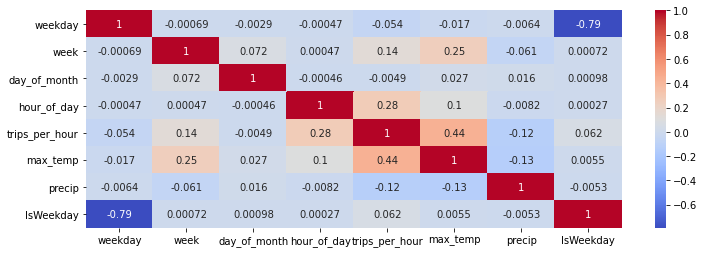

In [714]:
#check correlation again
fig,ax  = plt.subplots(figsize=(12,4))
sns.heatmap(chicago_final.corr(), annot=True,cmap ="coolwarm",ax=ax)

In [715]:
#correct precip dummy 
chicago_final["precip"].unique()

array([0., 1.])

In [1]:
#get dummies for precip
chicago_final["precip_dummy"] = chicago_final["precip"].astype(int)
chicago_final = chicago_final.drop(columns=['precip'])

NameError: name 'chicago_final' is not defined

In [706]:
chicago_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43824 entries, 0 to 43823
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   time_rounded    43824 non-null  datetime64[ns]
 1   weekday         43824 non-null  float64       
 2   week            43824 non-null  UInt32        
 3   day_of_month    43824 non-null  float64       
 4   hour_of_day     43824 non-null  float64       
 5   trips_per_hour  43824 non-null  float64       
 6   max_temp        43824 non-null  float64       
 7   IsWeekday       43824 non-null  bool          
 8   precip_dummy    43824 non-null  int64         
dtypes: UInt32(1), bool(1), datetime64[ns](1), float64(5), int64(1)
memory usage: 2.9 MB


In [ ]:
##how to normalize?
#add holiday dummy

In [80]:
#Cross validation
X = chicago_final.drop(columns=["trips_per_hour"])
Y = chicago_final[["trips_per_hour"]]

X_train, X_test, y_train, y_test = train_test_split(X, Y,test_size = 0.7,random_state = 2)


In [81]:
X_test.head()

,weekday,week,day_of_month,hour_of_day,max_temp,IsWeekday,precip_dummy
time_rounded,,,,,,,
2019-10-26 06:00:00,5,43,26,6,3.3,False,0
2019-01-09 07:00:00,2,2,9,7,-5.0,True,0
2015-12-20 00:00:00,6,51,20,0,-2.8,False,0
2016-08-20 22:00:00,5,33,20,22,25.0,False,0
2017-11-15 09:00:00,2,46,15,9,8.3,True,1


(-100.0, 3079.6)

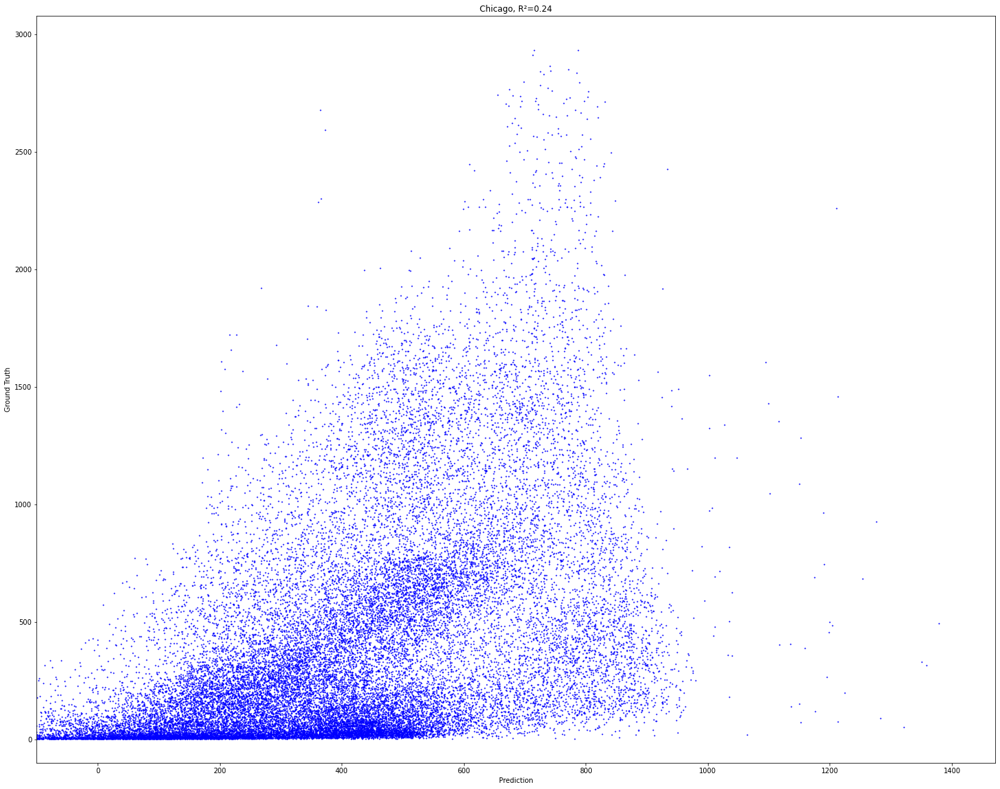

In [82]:
##multiple linear regression


lin_reg = LinearRegression(fit_intercept=True)
lin_reg.fit(X_train, y_train)
lin_reg_pred = lin_reg.predict(X_test)

fig, ax = plt.subplots(figsize=(25,20))

ax.scatter(lin_reg_pred, y_test, color="blue", s=1)

r2_lin_reg = r2_score(y_test, lin_reg_pred)

ax.set_title("Chicago, R²="+str(round(r2_lin_reg,4)))
ax.set_xlabel("Prediction")
ax.set_ylabel("Ground Truth")
ax.set_xlim(-100)
ax.set_ylim(-100)

In [83]:
lin_reg.coef_

array([[   2.33699093,    0.94300751,   -0.43219681,   17.04596579,
          15.00485951,   69.45499057, -126.9773011 ]])

In [84]:
lin_reg.intercept_

array([-23.33314032])

In [85]:
##as we can see, multi linear regression is not very accurate

(-200.0, 3128.8749359380336)

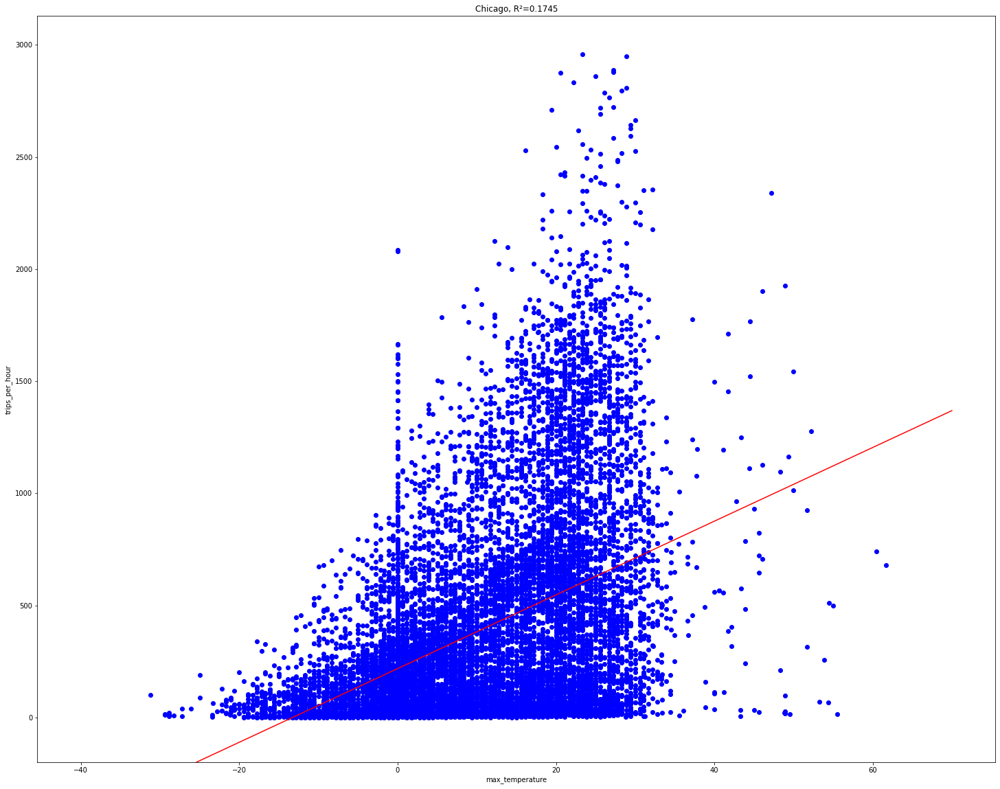

In [86]:
#singular linear regression: max temp vs trips per hour
X = chicago_final[["max_temp"]]
Y = chicago_final[["trips_per_hour"]]

X_train, X_test, y_train, y_test = train_test_split(X, Y,test_size = 0.7,random_state = 2)

lin_reg_single = LinearRegression(fit_intercept=True)
lin_reg_single.fit(X_train, y_train)
lin_reg_single_pred = lin_reg_single.predict(X_test)


fig, ax = plt.subplots(figsize=(25,20))

ax.scatter(X_train,y_train, color="blue")

r2_lin_reg_single = r2_score(y_test, lin_reg_single_pred)

Z = np.linspace(-40,70)
T = lin_reg_single.intercept_ + lin_reg_single.coef_*Z

ax.plot(Z,T[0], color = 'red')

ax.set_title("Chicago, R²="+str(round(r2_lin_reg_single,4)))
ax.set_xlabel("max_temperature")
ax.set_ylabel("trips_per_hour")
ax.set_ylim(-200)

In [ ]:
#we can see that up until 35 degrees, temperature and amount of trips seem to have a linear correlation. Warmer-->more trips.
#However, after 35 degrees temperature there is a sudden drop. Probably, beacause a threshold i reached and it is already too hot for people.

Text(0, 0.5, 'trips_per_hour')

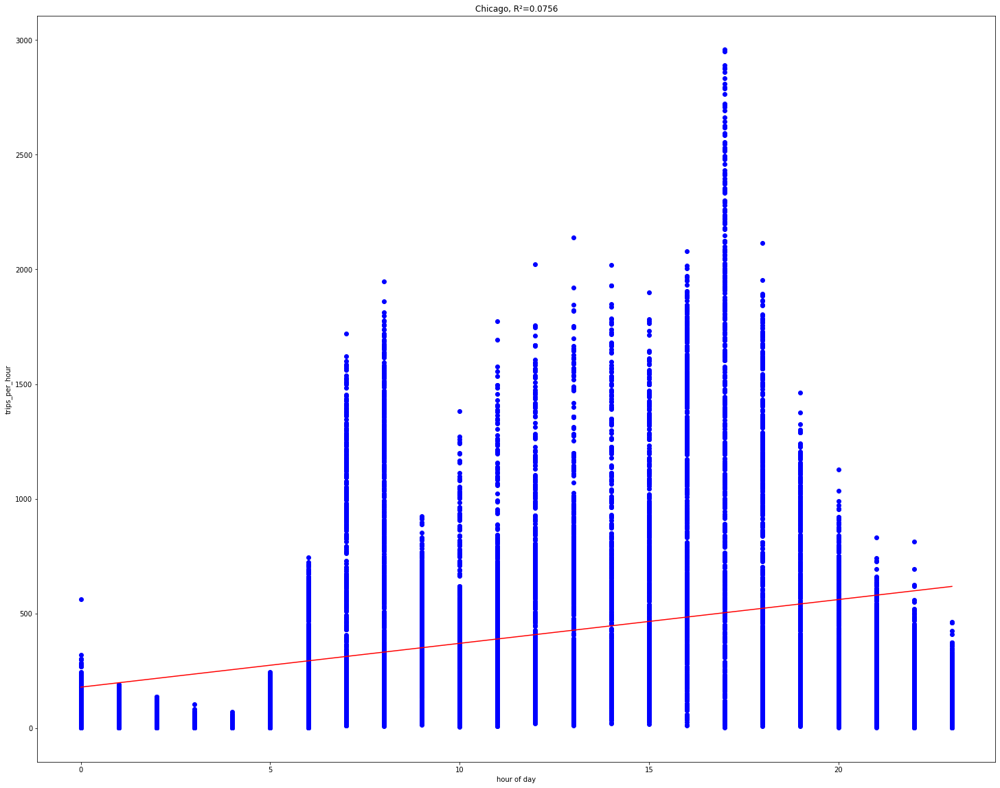

In [87]:
#singular linear regression: hour of day vs trips per hour
X = chicago_final[["hour_of_day"]]
Y = chicago_final[["trips_per_hour"]]

X_train, X_test, y_train, y_test = train_test_split(X, Y,test_size = 0.7,random_state = 2)

lin_reg_single = LinearRegression(fit_intercept=True)
lin_reg_single.fit(X_train, y_train)
lin_reg_single_pred = lin_reg_single.predict(X_test)


fig, ax = plt.subplots(figsize=(25,20))

ax.scatter(X_train,y_train, color="blue")

r2_lin_reg_single = r2_score(y_test, lin_reg_single_pred)

Z = np.linspace(0,23)
T = lin_reg_single.intercept_ + lin_reg_single.coef_*Z

ax.plot(Z,T[0], color = 'red')

ax.set_title("Chicago, R²="+str(round(r2_lin_reg_single,4)))
ax.set_xlabel("hour of day")
ax.set_ylabel("trips_per_hour")

In [ ]:
#Like temperature, the correlation between hour of day and trips seems to be not linear.
##Therefore, let's try another regression model

In [51]:
#lets minimize dataset
#chicago_final_sample = chicago_final.sample(500000)

Determination of Prediction coeficient:  0.8133263585657333


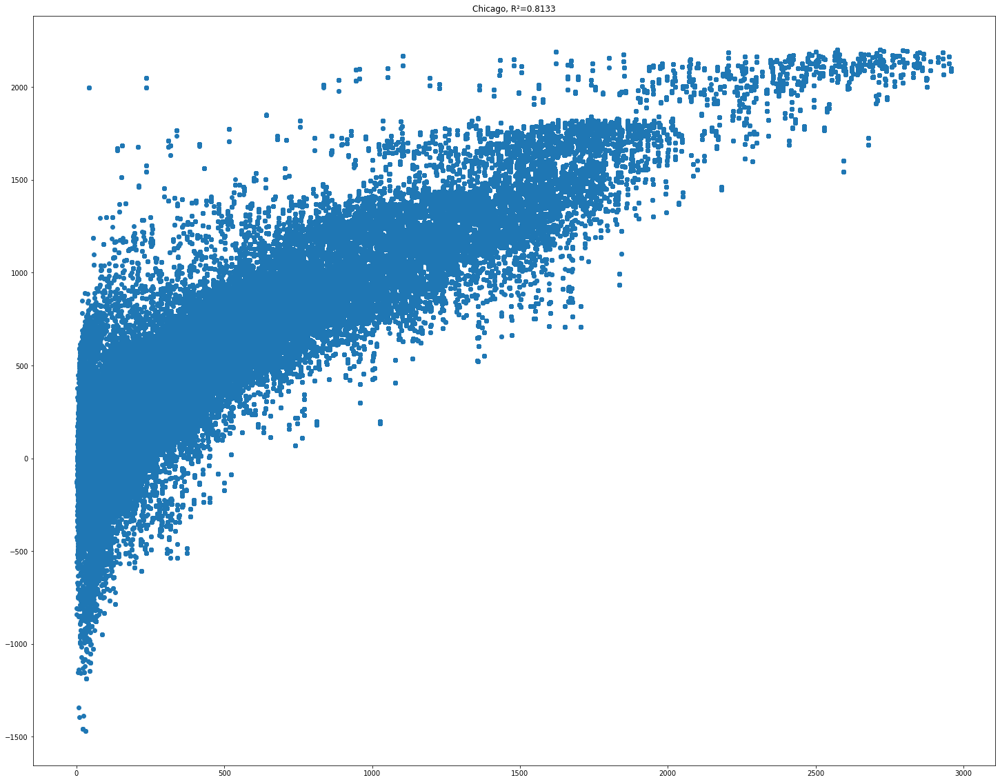

In [240]:
X = chicago_final_sample.drop(columns=["trips_per_hour"])
Y = chicago_final_sample[["trips_per_hour"]]


X_train, X_test, y_train, y_test = train_test_split(X, Y,test_size = 0.7, random_state=1)

regr = MLPRegressor(random_state=1, max_iter=500).fit(X_train, y_train)
mlp_reg_pred = regr.predict(X_test)

print('Determination of Prediction coeficient: ', regr.score(X_test, y_test))

fig, ax = plt.subplots(figsize=(25,20))

r2_mlp_reg = r2_score(y_test, mlp_reg_pred)
ax.set_title("Chicago, R²="+str(round(r2_mlp_reg,4)))

ax.scatter(y_test, mlp_reg_pred)

In [ ]:
#better, but still not good enough: alot of negative trip amount predictions also

No handles with labels found to put in legend.


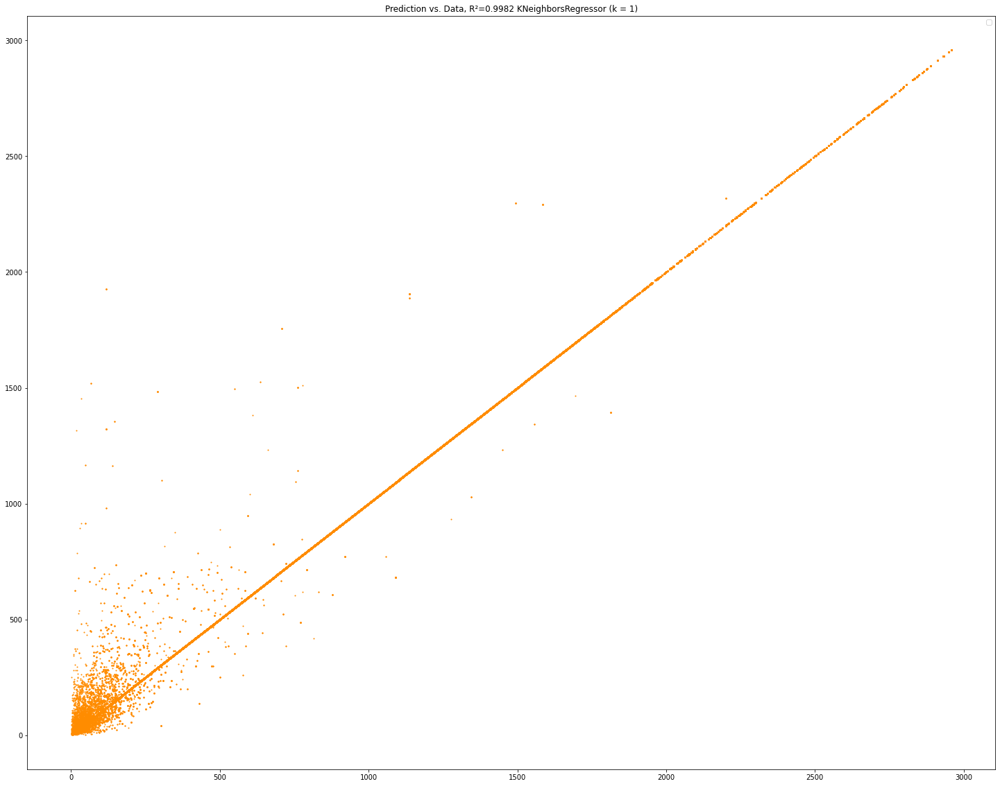

In [241]:
# Fit k neighbours regression model
n_neighbors = 1

X = chicago_final_sample.drop(columns=["trips_per_hour"])
Y = chicago_final_sample[["trips_per_hour"]]


X_train, X_test, y_train, y_test = train_test_split(X, Y,test_size = 0.7, random_state=6)


knn = neighbors.KNeighborsRegressor(n_neighbors).fit(X_train, y_train)
y_ = knn.predict(X_test)

fig, ax = plt.subplots(figsize=(25,20))

#plt.subplot(2, 1, i + 1)

ax.scatter(y_test, y_, color="darkorange",s=1)

r2_knn = r2_score(y_test, y_)
ax.set_title("Prediction vs. Data, R²="+str(round(r2_knn,4))+" KNeighborsRegressor (k = %i)" % (n_neighbors))
#plt.plot(X_test, y_, color="navy", label="prediction")
ax.axis("tight")
ax.legend()


In [ ]:
#seems to be very precise using 1 neares neighbours, only only performs bad when predicting few trips per hour

In [114]:
test_example = chicago_final.sample(5)

In [115]:
test_example.head()

,user_type,weekday,week,day_of_month,hour_of_day,trips_per_hour,max_temp,IsWeekday,precip_dummy
25647,0,6,49,8,2,30,1.1,False,0
20505,1,1,19,7,11,225,0.0,True,0
12338,0,1,35,28,22,84,31.1,True,0
5544,0,4,32,11,16,1774,23.3,True,0
25830,0,6,50,15,17,145,-5.6,False,0


In [116]:
ex1 = test_example.drop(columns=["trips_per_hour"])
ex2 = test_example[["trips_per_hour"]]

In [117]:
knn.predict(ex1)

array([[  38.],
       [ 225.],
       [  84.],
       [1774.],
       [ 145.]])

In [ ]:
##Arima Time Series Prediction

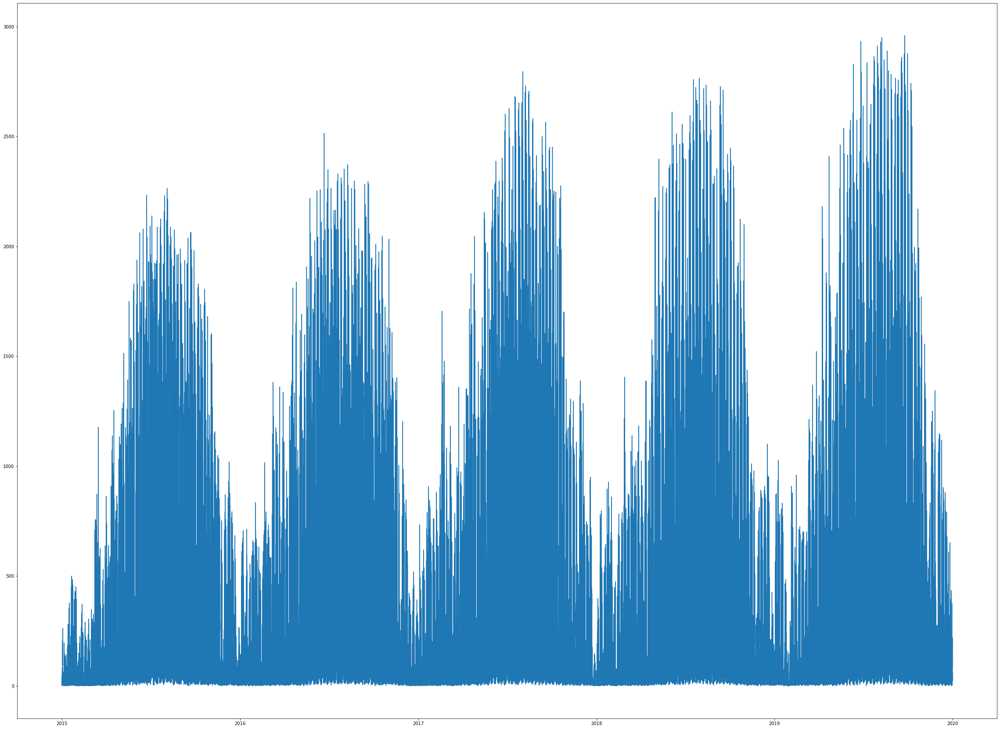

In [57]:
df_arima = chicago_final[['trips_per_hour']]


fig, ax = plt.subplots(figsize=(40,30))
ax.plot(df_arima)

In [718]:
#Let's decompose the data to remove trend and seasonality

<Figure size 432x288 with 0 Axes>

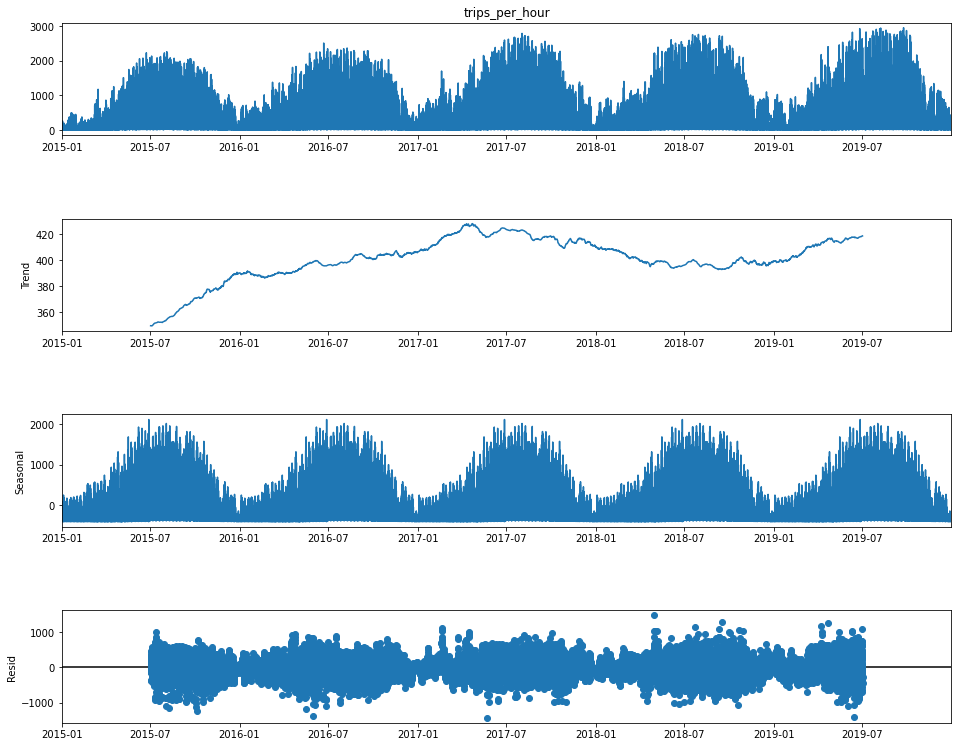

In [64]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(df_arima['trips_per_hour'], model='additive', period=(24*365))

residual = result.resid
fig = plt.figure()  
fig = result.plot()  
fig.set_size_inches(15, 12)

In [ ]:
#we see seasonality and more or less a trend, indicating non-stationarity

In [60]:
#import Augmented Dickey-Fuller unit root test
from statsmodels.tsa.stattools import adfuller

#create rolling statistics function
def test_stationarity(timeseries):
    
    #Determing rolling statistics, 12 hours
    rolmean = timeseries.rolling(window=12).mean()
    rolstd = timeseries.rolling(window=12).std()
    fig, ax = plt.subplots(figsize=(40,30))
    #Plot rolling statistics:
    orig = ax.plot(timeseries, color='blue',label='Original')
    mean = ax.plot(rolmean, color='red', label='Rolling Mean')
    std = ax.plot(rolstd, color='black', label = 'Rolling Std')
    ax.legend(loc='best')
    ax.set_xlabel('hour of day')
    ax.set_ylabel('amount of trips')
    ax.set_title('Rolling Mean & Standard Deviation')
    plt.show()
    
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:\n')
    dftest = adfuller(timeseries)
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

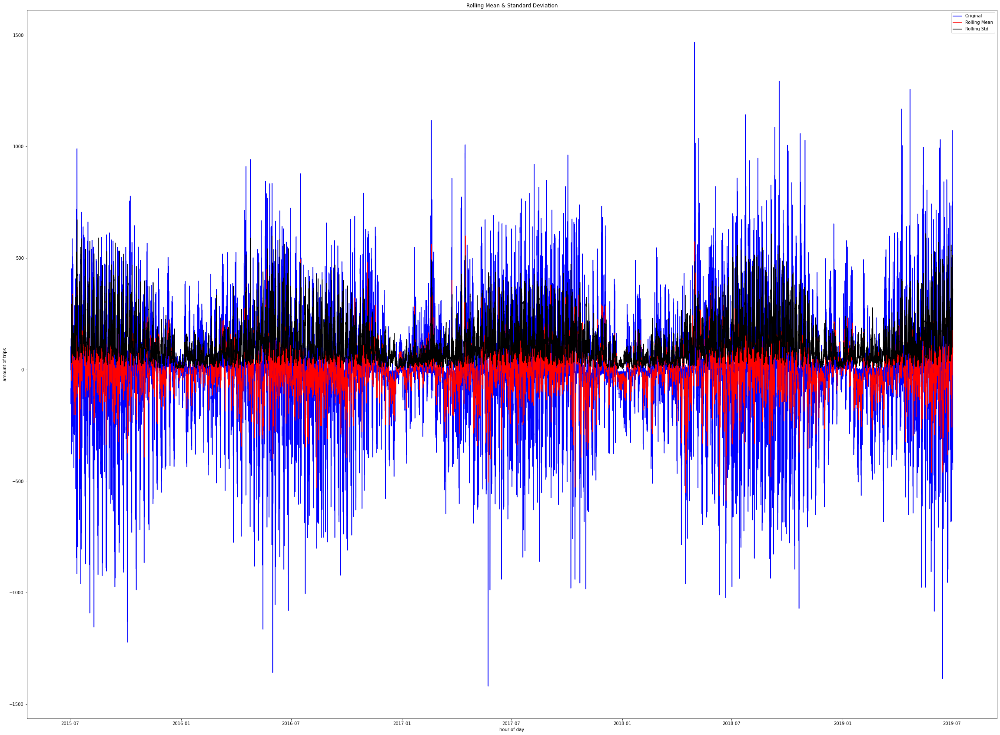

Results of Dickey-Fuller Test:

Test Statistic                   -21.366092
p-value                            0.000000
#Lags Used                        52.000000
Number of Observations Used    35011.000000
Critical Value (1%)               -3.430537
Critical Value (5%)               -2.861623
Critical Value (10%)              -2.566814
dtype: float64


In [65]:
#H0: Data is stationary
#H1: Data is non-stationary

#to check for stationarity we run statistics and Dickey Fuller test
residual.dropna(inplace=True)
test_stationarity(residual)

In [722]:
##Data seems to be stationary (high negative test statistic, very small p value, teststatistic < Critcal Value)
#not enough evidence to reject H0 hypothesis

(-0.2, 0.2)

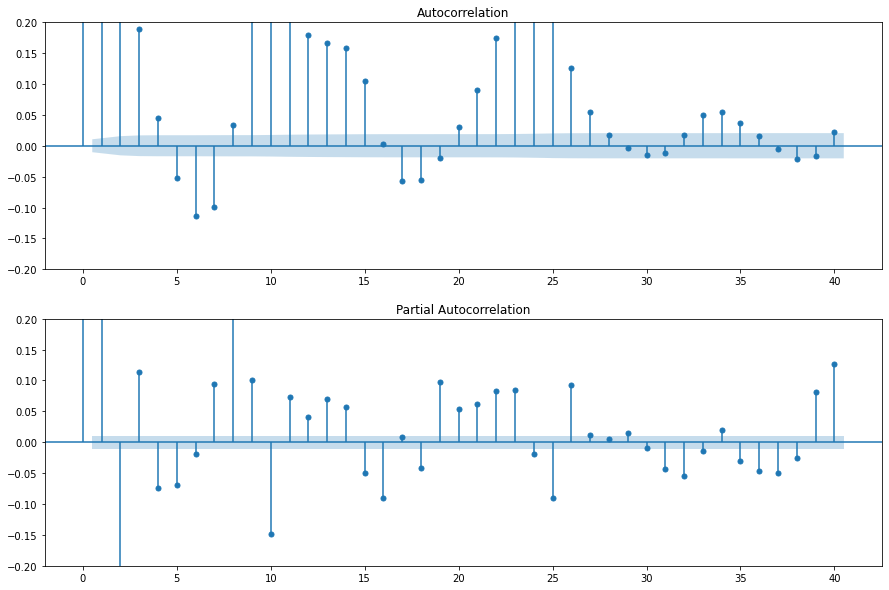

In [67]:
fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(residual, ax=ax1, lags=40)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(residual, ax=ax2, lags=40)
ax1.set_ylim([-0.2, 0.2])
ax2.set_ylim([-0.2, 0.2])

In [103]:
#Doesn't seem very promising, also data plotted and decomposition 

In [731]:
#provide explicit frequency for ARIMA
df_arima.index = df_arima.index.to_period('H')

                               SARIMAX Results                                
Dep. Variable:         trips_per_hour   No. Observations:                43824
Model:               ARIMA(16, 0, 15)   Log Likelihood             -284145.422
Date:                Mon, 13 Dec 2021   AIC                         568356.843
Time:                        15:47:28   BIC                         568643.545
Sample:                    01-01-2015   HQIC                        568447.205
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        396.5950     55.683      7.122      0.000     287.459     505.731
ar.L1          1.3055      1.126      1.160      0.246      -0.901       3.512
ar.L2         -0.4991      2.126     -0.235      0.8

<AxesSubplot:xlabel='time_rounded'>

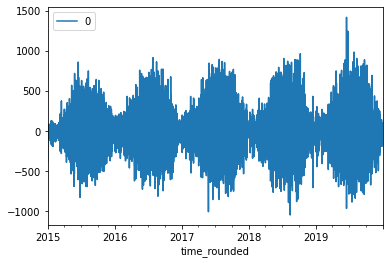

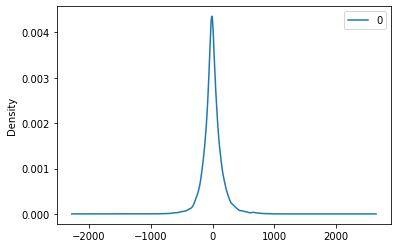

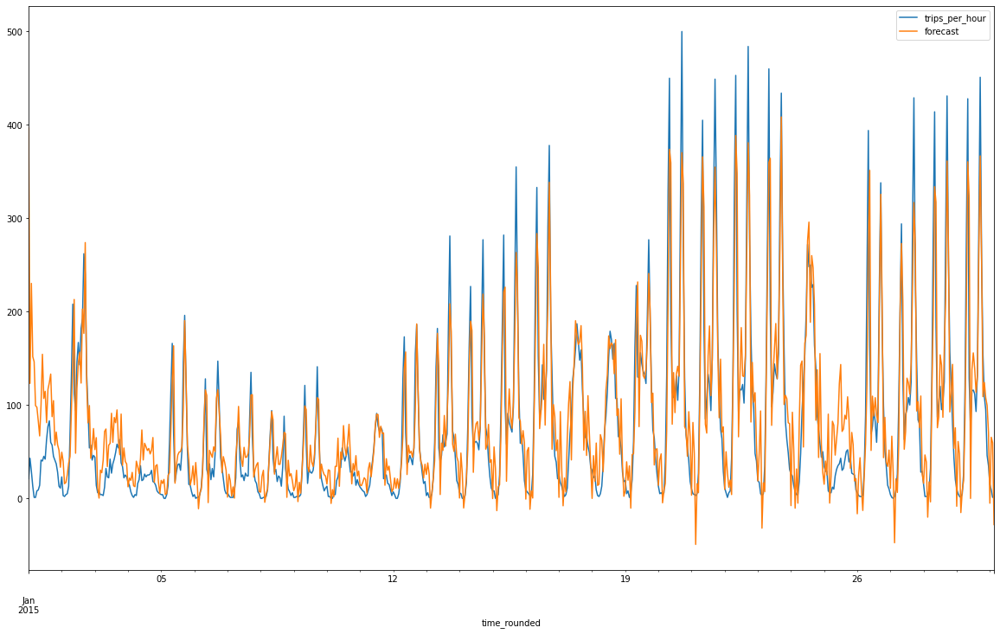

In [68]:
# Setting up ARIMA model
# p = AR = PACF lags = 16
# d = I = differences = 0
# q = MA = ACF lags = 15

model = ARIMA(df_arima, order=(16,0,15))
model_fit = model.fit()
df_arima['forecast']=model_fit.predict()

# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
# density plot of residuals
residuals.plot(kind='kde')
df_arima[['trips_per_hour','forecast']].head(700).plot(figsize=(20,12))

In [ ]:
#Not bad, lets try differencing either way (assume data is not stationary)

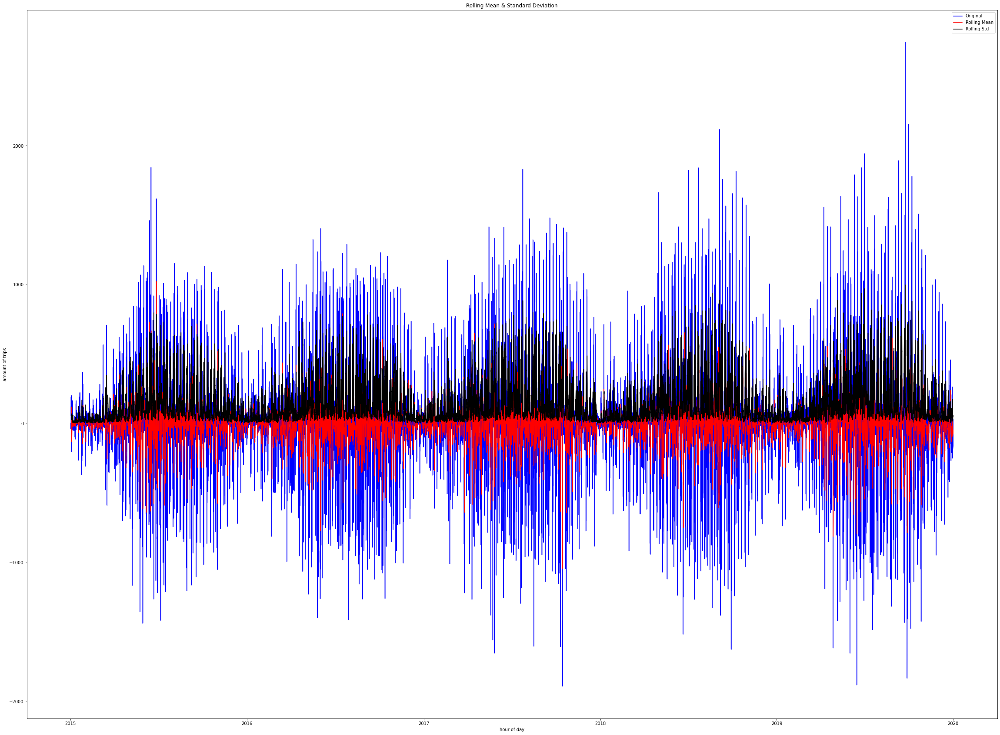

Results of Dickey-Fuller Test:

Test Statistic                   -37.060278
p-value                            0.000000
#Lags Used                        55.000000
Number of Observations Used    43744.000000
Critical Value (1%)               -3.430499
Critical Value (5%)               -2.861606
Critical Value (10%)              -2.566805
dtype: float64


In [733]:
df_arima = chicago_final[['trips_per_hour']]

first_diff = df_arima['trips_per_hour'].diff(24).dropna()


test_stationarity(first_diff)

(-0.2, 0.2)

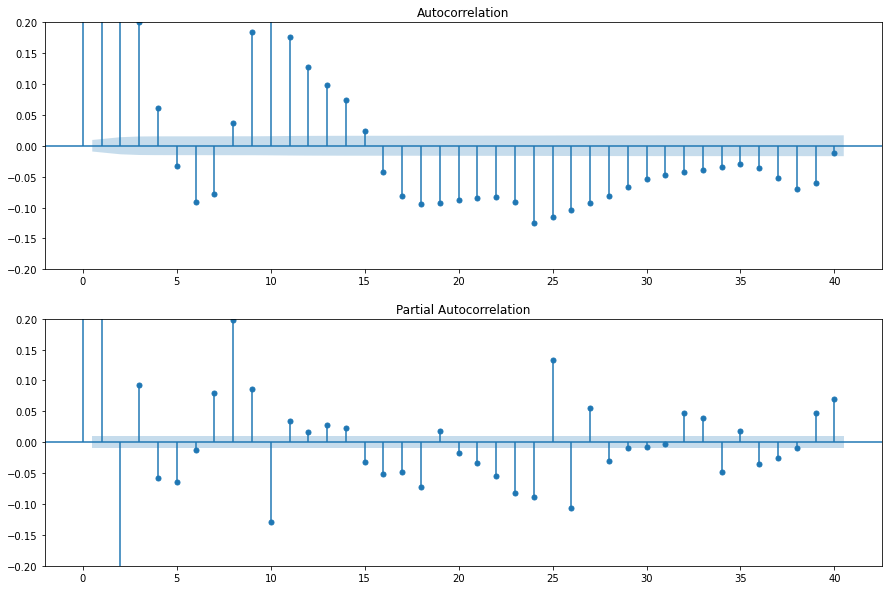

In [734]:
fig = plt.figure(figsize=(15,10))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(first_diff, ax=ax1, lags=40)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(first_diff, ax=ax2, lags=40)
ax1.set_ylim([-0.2, 0.2])
ax2.set_ylim([-0.2, 0.2])

In [735]:
df_arima.index = df_arima.index.to_period('H')

                               SARIMAX Results                                
Dep. Variable:         trips_per_hour   No. Observations:                43661
Model:                 ARIMA(1, 1, 0)   Log Likelihood             -299063.854
Date:                Tue, 07 Dec 2021   AIC                         598131.707
Time:                        16:22:14   BIC                         598149.076
Sample:                    01-02-2015   HQIC                        598137.182
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3360      0.003    120.283      0.000       0.331       0.342
sigma2      5.215e+04    186.240    279.998      0.000    5.18e+04    5.25e+04
Ljung-Box (L1) (Q):                 590.94   Jarque-

<AxesSubplot:xlabel='time_rounded'>

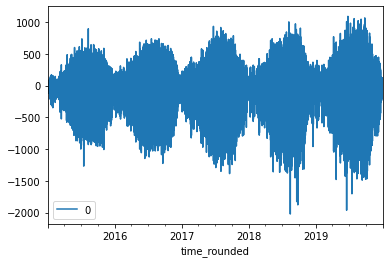

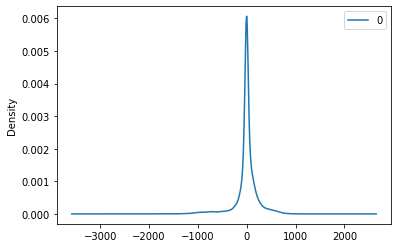

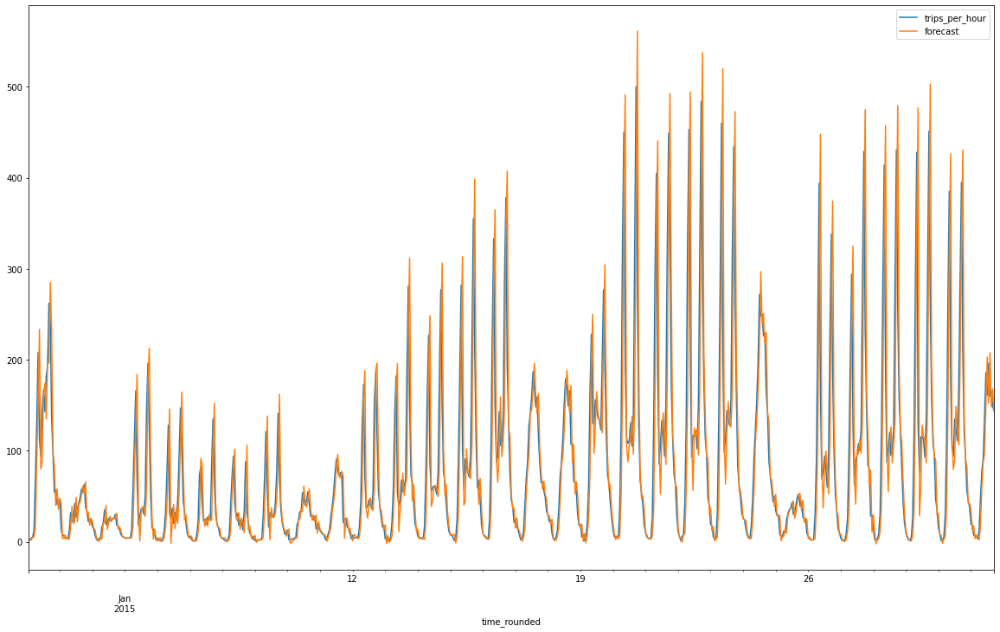

In [356]:
# Setting up ARIMA model
# p = AR = PACF lags = 1
# d = I = differences = 1
# q = MA = ACF lags

model = ARIMA(df_arima, order=(1,1,0))
model_fit = model.fit()
df_arima['forecast']=model_fit.predict()

# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
# density plot of residuals
residuals.plot(kind='kde')
df_arima[['trips_per_hour','forecast']].head(700).plot(figsize=(20,12))

In [357]:
df_arima.sample(20)

,trips_per_hour,forecast
time_rounded,,
2019-05-23 23:00,202,341.063829
2019-05-19 00:00,116,137.797252
2017-11-17 05:00,85,26.712623
2015-10-08 12:00,619,513.162198
2016-07-28 03:00,9,14.943231
2016-09-14 03:00,14,9.983780
2016-05-16 11:00,462,275.226028
2019-10-03 10:00,360,278.866041
2019-08-08 19:00,1314,1584.570554


In [ ]:
##SARIMAX

In [54]:
df_sarimax = chicago_final[['trips_per_hour']]

first_diff = df_sarimax.diff(24).dropna()

In [55]:
df_sarimax.index = df_sarimax.index.to_period('H')

                               SARIMAX Results                                
Dep. Variable:         trips_per_hour   No. Observations:                43824
Model:               SARIMAX(1, 1, 0)   Log Likelihood             -300098.534
Date:                Mon, 13 Dec 2021   AIC                         600201.069
Time:                        15:17:12   BIC                         600218.444
Sample:                    01-01-2015   HQIC                        600206.545
                         - 12-31-2019                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3361      0.003    120.747      0.000       0.331       0.342
sigma2      5.195e+04    184.807    281.117      0.000    5.16e+04    5.23e+04
Ljung-Box (L1) (Q):                 592.90   Jarque-

<AxesSubplot:xlabel='time_rounded'>

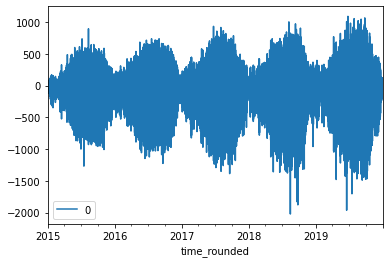

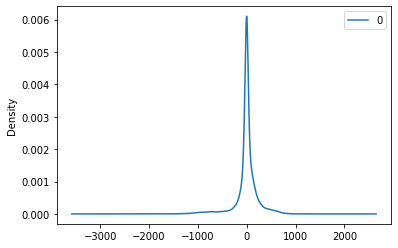

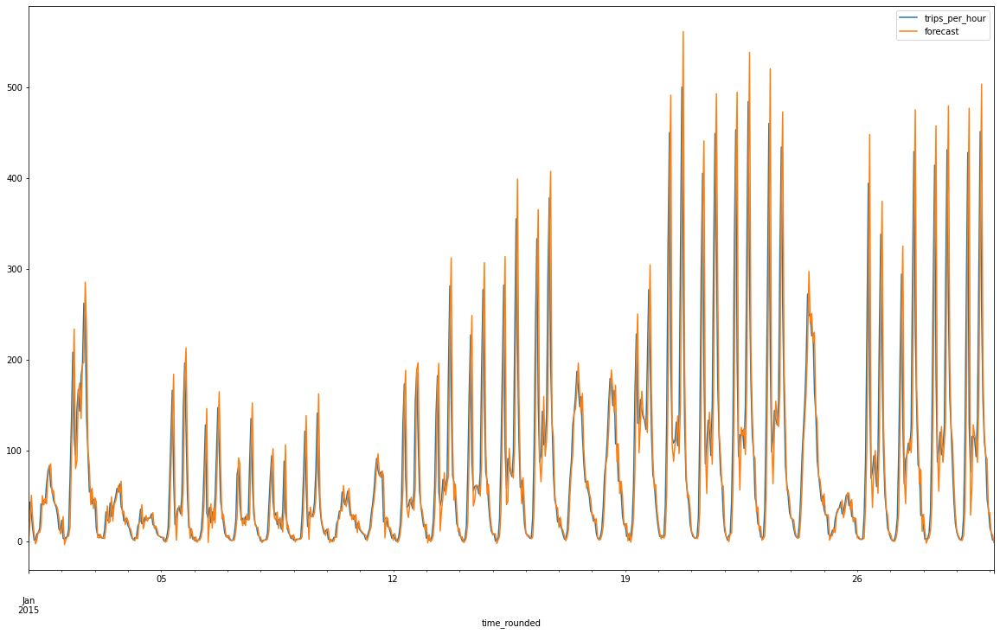

In [56]:
# 12 month = yearly 
sarimax_model = SARIMAX(df_sarimax, order=(1,1,0), seasonal_order=(0,0,0,12))

model_fit = sarimax_model.fit()
df_sarimax['forecast']=model_fit.predict()

# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = pd.DataFrame(model_fit.resid)
residuals.plot()
# density plot of residuals
residuals.plot(kind='kde')
df_sarimax[['trips_per_hour','forecast']].head(700).plot(figsize=(20,12))

In [ ]:
df_sarimax[['trips_per_hour','forecast']].sample(15)